## Load In Dependencies

In [2]:
# Supress Warnings
import warnings
warnings.filterwarnings('ignore')

# Visualization
import matplotlib.pyplot as plt
import seaborn as sns

# Data Science
import numpy as np
import pandas as pd

# Multi-dimensional arrays and datasets
import xarray as xr

# Geospatial raster data handling
import rioxarray as rxr

# Geospatial data analysis
import geopandas as gpd

# Geospatial operations
import rasterio
from rasterio import windows  
from rasterio import features  
from rasterio import warp
from rasterio.warp import transform_bounds 
from rasterio.windows import from_bounds
from rasterio.transform import from_origin

# Image Processing
from PIL import Image

# Coordinate transformations
from pyproj import Proj, Transformer, CRS

# Feature Engineering
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder
from sklearn.model_selection import GridSearchCV, train_test_split, KFold, cross_val_score


# Evaluation Metrics
from sklearn.metrics import r2_score

# Machine Learning
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from catboost import CatBoostRegressor

# Planetary Computer Tools
import pystac_client
import planetary_computer as pc
from pystac.extensions.eo import EOExtension as eo

# Others
from scipy.spatial import cKDTree
from pykrige.ok import OrdinaryKriging
import missingno as msno
import os
from tqdm import tqdm

In [55]:
val_pred = pd.read_csv('val_prediction.csv', index_col='Unnamed: 0')
test_pred = pd.read_csv('test_prediction.csv', index_col='Unnamed: 0')

In [57]:
pred_col = ['11', '33', '55', '99']
val_pred['large_residuals'] = 0
large_residuals = val_pred['large_residuals'].copy()
small_residuals = val_pred['large_residuals'].copy()

for col in pred_col:
    residuals = val_pred[col] - val_pred['y_true']
    large_residuals += np.where(residuals > 0.002, 1, 0)
    small_residuals += np.where(residuals < -0.002, 1, 0)


val_pred['large_residuals'] = np.where(large_residuals + small_residuals == 0, 0, 
                                       np.where(large_residuals >= small_residuals, 2, 1))

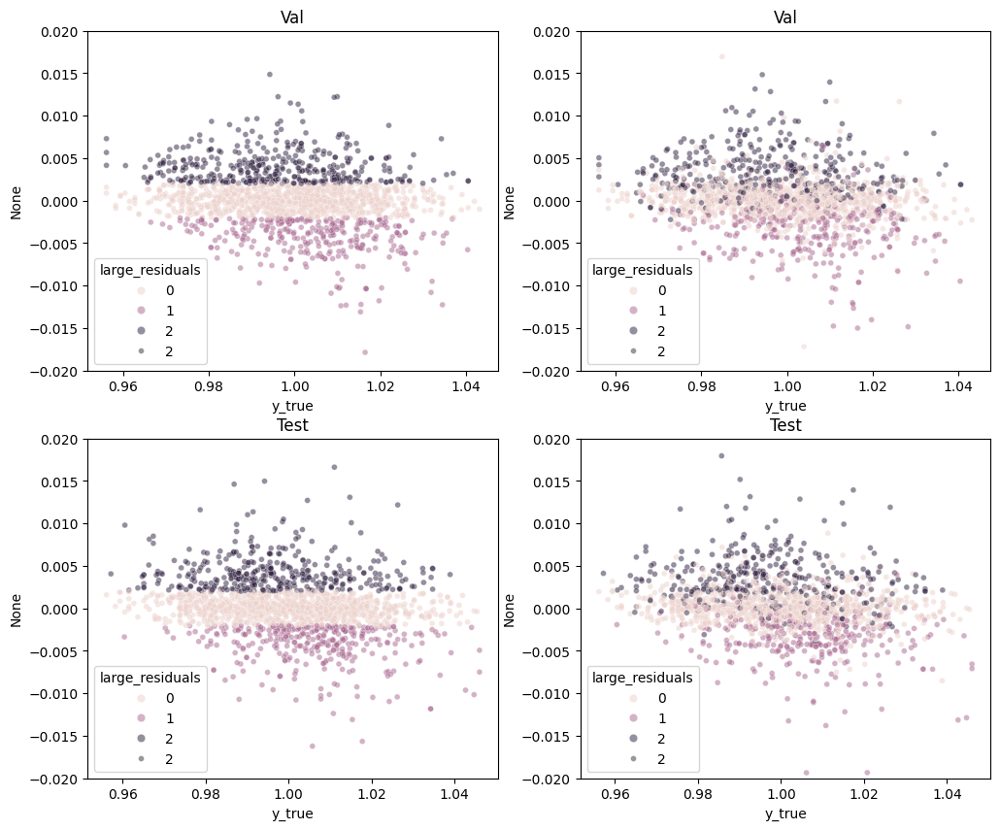

In [58]:
fig, axes = plt.subplots(2, 2, figsize=(12, 5*2))
axes = axes.flatten()

residuals = val_pred['11'] - val_pred['y_true']
val_pred['large_residuals'] = np.where(residuals > 0.002, 2,
                                       np.where(residuals < -0.002, 1, 0))

sns.scatterplot(x=val_pred['y_true'], y=residuals, hue=val_pred['large_residuals'], alpha=0.5, size=2, ax=axes[0])
axes[0].set_title(f'Val')
axes[0].set_ylim((-0.02, 0.02))


sns.scatterplot(x=val_pred['y_true'], y=val_pred['99'] - val_pred['y_true'], hue=val_pred['large_residuals'], alpha=0.5, size=2, ax=axes[1])
axes[1].set_title(f'Val')
axes[1].set_ylim((-0.02, 0.02))


residuals = test_pred['11'] - test_pred['y_true']
test_pred['large_residuals'] = np.where(residuals > 0.002, 2,
                                       np.where(residuals < -0.002, 1, 0))

sns.scatterplot(x=test_pred['y_true'], y=residuals, hue=test_pred['large_residuals'], alpha=0.5, size=2, ax=axes[2])
axes[2].set_title(f'Test')
axes[2].set_ylim((-0.02, 0.02))


sns.scatterplot(x=test_pred['y_true'], y=test_pred['99'] - test_pred['y_true'], hue=test_pred['large_residuals'], alpha=0.5, size=2, ax=axes[3])
axes[3].set_title(f'Test')
axes[3].set_ylim((-0.02, 0.02))

plt.show()

In [59]:
ground_df = pd.read_csv("../Training_data_uhi_index_2025-02-18.csv")
ground_df.head()

,Longitude,Latitude,datetime,UHI Index
0,-73.909167,40.813107,24-07-2021 15:53,1.030289
1,-73.909187,40.813045,24-07-2021 15:53,1.030289
2,-73.909215,40.812978,24-07-2021 15:53,1.023798
3,-73.909242,40.812908,24-07-2021 15:53,1.023798
4,-73.909257,40.812845,24-07-2021 15:53,1.021634


In [60]:
data_folder = "../data_pipeline/data/tabular_data/train/1x1"
for i, filename in tqdm(enumerate(os.listdir(data_folder))):
    if filename.endswith(".csv"):
        file_path = os.path.join(data_folder, filename)
        df = pd.read_csv(file_path)
        df = df.iloc[:, 2:]
        ground_df = pd.concat([ground_df, df], axis=1)

data_folder = "../data_pipeline/data/tabular_data/train/3x3"
for i, filename in tqdm(enumerate(os.listdir(data_folder))):
    if filename.endswith(".csv"):
        file_path = os.path.join(data_folder, filename)
        df = pd.read_csv(file_path)
        df = df.iloc[:, 2:]
        ground_df = pd.concat([ground_df, df], axis=1)

data_folder = "../data_pipeline/data/tabular_data/train/5x5"
for i, filename in tqdm(enumerate(os.listdir(data_folder))):
    if filename.endswith(".csv"):
        file_path = os.path.join(data_folder, filename)
        df = pd.read_csv(file_path)
        df = df.iloc[:, 2:]
        ground_df = pd.concat([ground_df, df], axis=1)

data_folder = "../data_pipeline/data/tabular_data/train/9x9"
for i, filename in tqdm(enumerate(os.listdir(data_folder))):
    if filename.endswith(".csv"):
        file_path = os.path.join(data_folder, filename)
        df = pd.read_csv(file_path)
        df = df.iloc[:, 2:]
        ground_df = pd.concat([ground_df, df], axis=1)

28it [00:00, 45.25it/s]
56it [00:03, 18.50it/s]
54it [00:05, 10.33it/s]
54it [00:07,  7.44it/s]


In [84]:
val_data = ground_df.loc[val_pred.index, :]

In [85]:
val_data['large_residuals'] = val_pred['large_residuals']

In [110]:
import scipy.stats as stats
import statsmodels.api as sm
import statsmodels.formula.api as smf
from scipy.stats import kruskal

# val_data = val_data.fillna(-1)
# val_data = val_data.drop(columns=['Unnamed: 4', 'None_mean_3x3', 'None_std_dev_3x3', 'None_mean_5x5', 'None_std_dev_5x5', 
#                                   'None_mean_9x9', 'None_std_dev_9x9'])

categorical_col = "large_residuals"  # Replace with your actual categorical column
numerical_cols = val_data.drop(columns=['UHI Index', 'datetime', 'Latitude', 'Longitude']).columns.tolist()

# Remove the categorical column from numerical list (if mistakenly included)
numerical_cols = [col for col in numerical_cols if col != categorical_col]

# Perform ANOVA for each numerical variable
# Perform Welch’s ANOVA for each numerical variable
anova_results = {}
for num_col in numerical_cols:
    print(num_col)
    groups = [val_data[num_col][val_data[categorical_col] == category].dropna() for category in val_data[categorical_col].unique()]
    # Perform Kruskal-Wallis test
    stat, p_value = kruskal(*groups)
    
    anova_results[num_col] = p_value
    # print(f'{num_col}: {p_value}')

# Convert results to DataFrame and sort by significance
anova_df = pd.DataFrame(anova_results.items(), columns=["Variable", "P-Value"])
anova_df = anova_df.sort_values(by="P-Value")



aod47
aod55
building_height_res100
building_height_std_res100
building_year_res100
building_area_res100
building_height_res30
building_height_std_res30
building_year_res30
building_area_res30
var_res100
building_area_per_pixel_res100
var_res30
building_area_per_pixel_res30
canopy_heigth
canopy_heigth_res10
canopy_heigth_count_res10
canopy_heigth_res30
canopy_heigth_count_res30
canopy_heigth_res5
canopy_heigth_count_res5
co_july24
hcho_july24
red
blue
green
nir08
swir16
swir22
coastal
lwir11
ndvi
evi
savi
gndvi
arvi
msavi
ndwi
awei_nsh
awei_sh
ndsi
nbr
si
ndbi
ui
ibi
albedo
no2_july24
overlay_level2_res30
overlay_level1_res30
sd_level1_res30
sd_level2_res30
zonedist_level1_res100
zonedist_level2_res100
zonedist_level3_res100
has_residence_res100
has_manufacture_res100
has_commercial_res100
has_park_res100
zonedist_level1_res1000
zonedist_level2_res1000
zonedist_level3_res1000
has_residence_res1000
has_manufacture_res1000
has_commercial_res1000
has_park_res1000
zonedist_level1_res200
zon

In [67]:
val_data['large_residuals'].astype('category').describe()

count     1684
unique       3
top          0
freq       996
Name: large_residuals, dtype: int64

In [108]:
val_data['large_residuals'] = np.where(val_data['large_residuals'] > 0, 1, 0)

In [111]:
anova_df.to_csv('anova_large_residuals.csv')

In [112]:
col_to_check = [
"building_height_res100_std_dev_9x9",
"var_res100_std_dev_9x9",
"building_height_std_res100",
"albedo_std_dev_9x9",
"swir16_std_dev_9x9",
"building_height_std_res100_mean_9x9",
"building_height_std_res100_std_dev_9x9",
"building_height_std_res100_mean_3x3",
"var_res100_mean_9x9",
"awei_nsh_std_dev_9x9",
"ibi_std_dev_9x9",
"building_height_std_res30_mean_5x5",
"building_height_res100_mean_9x9",
"var_res100_mean_3x3",
"building_height_res100_mean_3x3",
"swir22_std_dev_9x9",
"coastal_std_dev_9x9",
"building_height_std_res30_mean_9x9",
"building_height_std_res30_std_dev_5x5",
"building_height_res100",
"var_res100_mean_5x5",
"building_height_std_res30_std_dev_9x9",
"var_res100_std_dev_5x5",
"building_height_std_res100_mean_5x5",
"o3_july24_std_dev_5x5",
"blue_std_dev_9x9",
"building_height_res100_std_dev_5x5",
"var_res100",
"var_res30",
"green_std_dev_9x9",
"building_height_res100_mean_5x5",
"var_res30_std_dev_9x9",
"swir22_mean_9x9",
"building_height_res30",
"building_height_res30_std_dev_9x9",
"red_mean_9x9",
"var_res30_mean_5x5",
"coastal_mean_9x9",
"green_mean_9x9",
"blue_mean_9x9",
"var_res30_mean_3x3",
"co_july24_mean_9x9",
"var_res30_std_dev_5x5",
"nbr_mean_9x9",
"building_height_res30_mean_3x3",
"building_height_std_res100_std_dev_5x5",
"ndsi_mean_9x9",
"gndvi_mean_9x9",
"ndwi_mean_9x9",
"var_res30_mean_9x9",
"awei_sh_mean_9x9",
"ndbi_mean_9x9",
"ui_mean_9x9",
"ndvi_mean_9x9",
"building_height_res30_mean_5x5",
"swir16_mean_9x9",
"var_res30_std_dev_3x3",
"population_res1000_std_dev_3x3",
"red_std_dev_9x9",
"building_height_std_res30_mean_3x3",
"building_height_res30_std_dev_5x5",
"building_height_res30_mean_9x9",
"arvi_mean_9x9",
"si_mean_9x9",
"savi_mean_9x9",
"msavi_mean_9x9",
"evi_mean_9x9",
"arvi_std_dev_9x9",
"canopy_heigth_res30_std_dev_5x5",
"var_res100_std_dev_3x3",
"ui_std_dev_5x5",
"building_height_res100_std_dev_3x3",
"co_july24_std_dev_9x9",
"population_res1000_std_dev_9x9",
"building_height_std_res100_std_dev_3x3",
"evi_std_dev_5x5",
"ibi_mean_9x9",
]

building_height_res100_std_dev_9x9
var_res100_std_dev_9x9
building_height_std_res100
albedo_std_dev_9x9
swir16_std_dev_9x9
building_height_std_res100_mean_9x9
building_height_std_res100_std_dev_9x9
building_height_std_res100_mean_3x3
var_res100_mean_9x9
awei_nsh_std_dev_9x9
ibi_std_dev_9x9
building_height_std_res30_mean_5x5
building_height_res100_mean_9x9
var_res100_mean_3x3
building_height_res100_mean_3x3
swir22_std_dev_9x9
coastal_std_dev_9x9
building_height_std_res30_mean_9x9
building_height_std_res30_std_dev_5x5
building_height_res100
var_res100_mean_5x5
building_height_std_res30_std_dev_9x9
var_res100_std_dev_5x5
building_height_std_res100_mean_5x5
o3_july24_std_dev_5x5
blue_std_dev_9x9
building_height_res100_std_dev_5x5
var_res100
var_res30
green_std_dev_9x9
building_height_res100_mean_5x5
var_res30_std_dev_9x9
swir22_mean_9x9
building_height_res30
building_height_res30_std_dev_9x9
red_mean_9x9
var_res30_mean_5x5
coastal_mean_9x9
green_mean_9x9
blue_mean_9x9
var_res30_mean_3x3
co

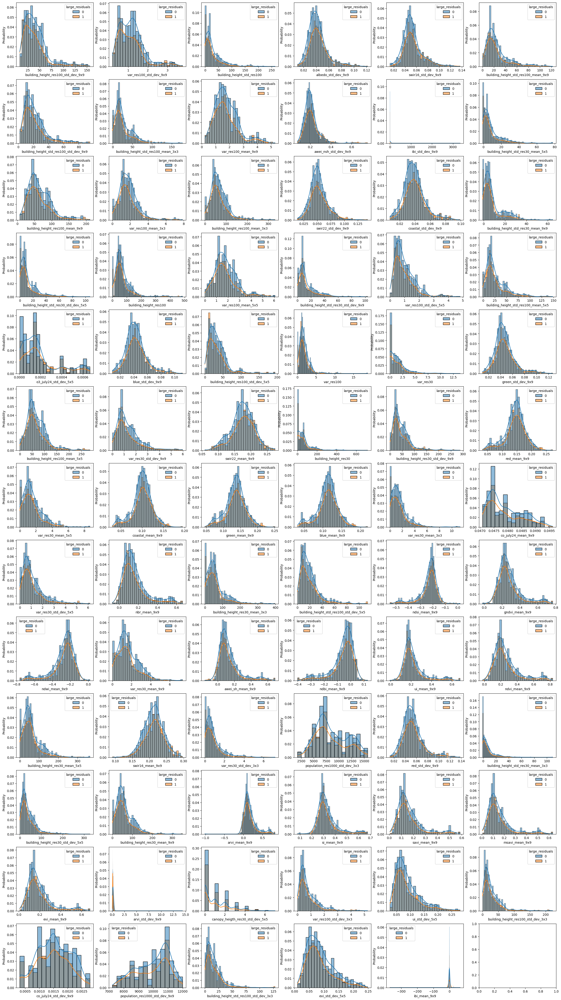

In [113]:
fig, axes = plt.subplots(13, 6, figsize=(30, 55))
axes = axes.flatten()

# Iterate over all pairs
for i, col in enumerate(col_to_check):
    print(col)
    ax = axes[i]
    sns.histplot(x=col, data=val_data, hue='large_residuals', stat='probability', kde=True, ax=ax)
    ax.set_xlabel(col)

plt.show()

(0.0, 7.0)

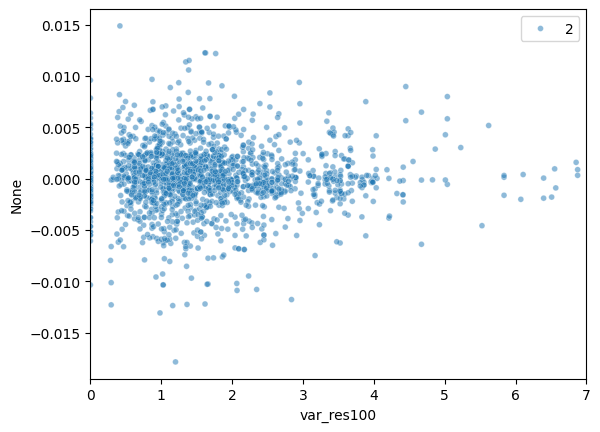

In [168]:
sns.scatterplot(x=val_data['var_res100'], 
                y=val_pred['11'] - val_pred['y_true'], size=2, alpha=0.5)
plt.xlim(0, 7)

(4000.0, 13000.0)

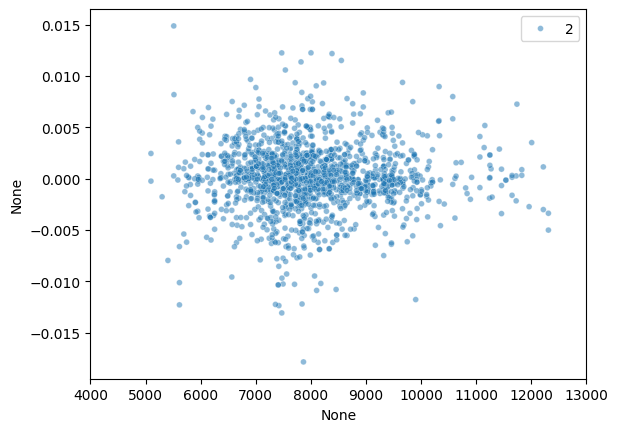

In [166]:
sns.scatterplot(x=np.log(val_data['building_height_res100'] + 1) * val_data['building_year_res100'], 
                y=val_pred['11'] - val_pred['y_true'], size=2, alpha=0.5)
plt.xlim(4000, 13000)

In [102]:
import sys
import os

sys.path.append(os.path.abspath("../src"))
import eda
# from src.eda import EDA

stat_eda = eda.EDA(ground_df)
stat_eda.explore_stats().to_csv('eda_features_all.csv', index=False)

In [106]:
corr_mat = ground_df.drop(columns=['datetime']).corr()

In [107]:
corr_mat.to_csv('correlation_all.csv')

## Response Variable

In [2]:
# Load the training data from csv file and display the first few rows to inspect the data
ground_df = pd.read_csv("../Training_data_uhi_index_2025-02-18.csv")
ground_df

,Longitude,Latitude,datetime,UHI Index
0,-73.909167,40.813107,24-07-2021 15:53,1.030289
1,-73.909187,40.813045,24-07-2021 15:53,1.030289
2,-73.909215,40.812978,24-07-2021 15:53,1.023798
3,-73.909242,40.812908,24-07-2021 15:53,1.023798
4,-73.909257,40.812845,24-07-2021 15:53,1.021634
...,...,...,...,...
11224,-73.957050,40.790333,24-07-2021 15:57,0.972470
11225,-73.957063,40.790308,24-07-2021 15:57,0.972470
11226,-73.957093,40.790270,24-07-2021 15:57,0.981124
11227,-73.957112,40.790253,24-07-2021 15:59,0.981245


## Predictor Variables

### Extracting GeoTIFF Image

In [7]:
tiff_path = "../data_pipeline/data/raw/Annual_NLCD_LndCov_2021_CU_C1V0.tif"

# Read the bands from the GeoTIFF file
with rasterio.open(tiff_path) as dst:
    window = rasterio.windows.Window(80000, 50000, 1000, 1000)  # Read top-left 1000×1000 pixels
    subset = dst.read(1, window=window)
    # unique_values = np.unique(subset)
    meta = dst.meta
    count = dst.count

# band_name = desc 
# band_lst = [red, blue, green, nir08, swir16, swir22, coastal, lwir11]
# fig, axes = plt.subplots(2, 4, figsize=(20, 10))

# # Flatten the axes for easier indexing
# axes = axes.flatten()

# for i in range(len(band_lst)):
#     im = axes[i].imshow(band_lst[i], cmap='viridis')
#     axes[i].set_title(band_name[i])
#     fig.colorbar(im, ax=axes[i])

# plt.tight_layout()
# plt.show()

In [3]:
meta

{'driver': 'GTiff',
 'dtype': 'uint8',
 'nodata': 250.0,
 'width': 160000,
 'height': 105000,
 'count': 1,
 'crs': CRS.from_wkt('PROJCS["AEA        WGS84",GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AUTHORITY["EPSG","4326"]],PROJECTION["Albers_Conic_Equal_Area"],PARAMETER["latitude_of_center",23],PARAMETER["longitude_of_center",-96],PARAMETER["standard_parallel_1",29.5],PARAMETER["standard_parallel_2",45.5],PARAMETER["false_easting",0],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]]'),
 'transform': Affine(30.0, 0.0, -2415585.0,
        0.0, -30.0, 3314805.0)}

#### Landsat8 bands

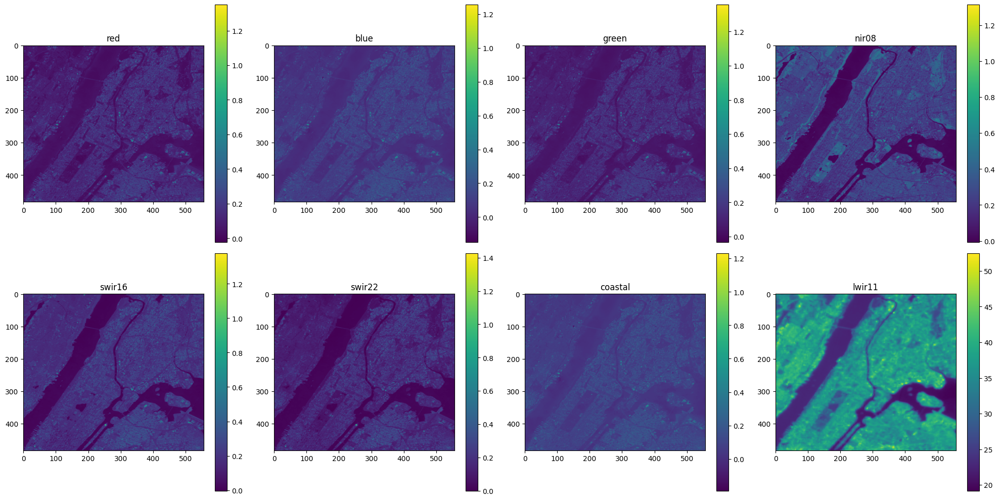

In [3]:
# Open the GeoTIFF file
tiff_path = "../data_pipeline/data/tiff/1x1/landsat_8.tiff"

# Read the bands from the GeoTIFF file
with rasterio.open(tiff_path) as dst:
    red = dst.read(1)
    blue = dst.read(2)
    green = dst.read(3)
    nir08 = dst.read(4)
    swir16 = dst.read(5)
    swir22 = dst.read(6)
    coastal = dst.read(7) 
    lwir11 = dst.read(8)
    desc = dst.descriptions
    height = dst.height
    width = dst.width
    meta = dst.meta
    transform = dst.transform
    # Get the CRS (Coordinate Reference System)
    crs = dst.crs

band_name = desc 
band_lst = [red, blue, green, nir08, swir16, swir22, coastal, lwir11]
fig, axes = plt.subplots(2, 4, figsize=(20, 10))

# Flatten the axes for easier indexing
axes = axes.flatten()

for i in range(len(band_lst)):
    im = axes[i].imshow(band_lst[i], cmap='viridis')
    axes[i].set_title(band_name[i])
    fig.colorbar(im, ax=axes[i])

plt.tight_layout()
plt.show()

In [61]:
# Get the dimensions of the raster
rows, cols = aod_55.shape

# Initialize lists to store coordinates and values
x_coords = []
y_coords = []
values = []

# Loop through each pixel
for row in range(rows):
    for col in range(cols):
        # Get the pixel value (temperature)
        value = aod_55[row, col]
        # Skip NaN or no-data values (if applicable)
        if np.isnan(value):
            continue
        # Calculate the centroid coordinates (x, y) in geographic CRS
        x, y = transform * (col + 0.5, row + 0.5)  # +0.5 to get the centroid
        # Append to lists
        x_coords.append(x)
        y_coords.append(y)
        values.append(value)

# Create a DataFrame
point_data = pd.DataFrame({
    'x': x_coords,
    'y': y_coords,
    'temperature': values
})

In [66]:
transform

Affine(0.008983152841195215, 0.0, -74.01219625860737,
       0.0, -0.008983152841195215, 40.88232858027943)

In [64]:
point_data_sample = point_data.sample(n=255, random_state=42)

In [ ]:
0.030

In [16]:
ndvi = band_lst[0]
ndvi[ndvi < -1] = -1

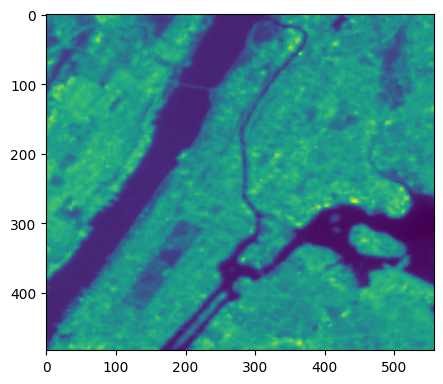

In [6]:
plt.figure(figsize=(5, 5))

im = plt.imshow(lwir11, cmap='viridis')
# fig.colorbar(im)a

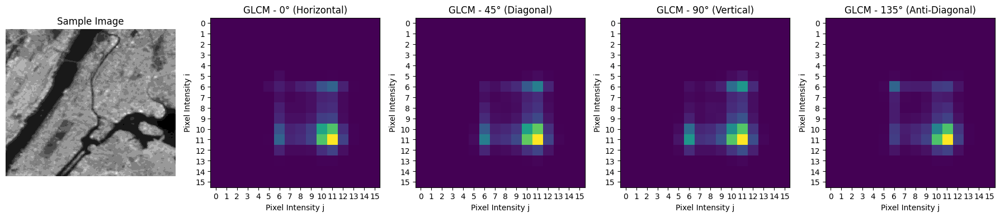

In [15]:
from skimage.feature import graycomatrix, graycoprops
image_array = (lwir11 / (lwir11.max()+1) * 16).astype(np.uint8)

# --- Step 2: Define distances and angles ---
distances = [100]  # You can try [1, 2, 3] for different neighbor spacing
angles = [0, np.pi/4, np.pi/2, 3*np.pi/4]  # 0°, 45°, 90°, 135°
angle_labels = ['0° (Horizontal)', '45° (Diagonal)', '90° (Vertical)', '135° (Anti-Diagonal)']

# --- Step 3: Plot original image ---
fig, axs = plt.subplots(1, len(angles)+1, figsize=(18, 4))
axs[0].imshow(image_array, cmap='gray', interpolation='none')
axs[0].set_title("Sample Image")
axs[0].axis('off')

# --- Step 4: Compute and plot GLCM matrices ---
for idx, angle in enumerate(angles):
    # Compute GLCM
    glcm = graycomatrix(image_array,
                        distances=distances,
                        angles=[angle],
                        levels=16,            # number of gray levels in the image
                        symmetric=True,
                        normed=True)
    
    glcm_matrix = glcm[:, :, 0, 0]  # Extract 2D matrix for distance=1 and angle=angle

    # Plot GLCM matrix
    axs[idx+1].imshow(glcm_matrix, cmap='viridis', interpolation='none')
    axs[idx+1].set_title(f"GLCM - {angle_labels[idx]}")
    axs[idx+1].set_xlabel('Pixel Intensity j')
    axs[idx+1].set_ylabel('Pixel Intensity i')
    axs[idx+1].set_xticks(range(glcm_matrix.shape[1]))
    axs[idx+1].set_yticks(range(glcm_matrix.shape[0]))

plt.tight_layout()
plt.show()

In [54]:
def extract_glcm(raster_arr, size=1):  # 3x3: size = 1, 5x5: size = 2
    raster_scaled = ((raster_arr - raster_arr.min()) / (raster_arr.max() - raster_arr.min() + 1) * 16).astype(np.uint8)
    m, n = raster_scaled.shape
    smoothed_raster = np.zeros((m, n))
    smoothed_raster2 = np.zeros((m, n))

    for i in tqdm(range(m)):
        for j in range(n):
            neighbors = raster_scaled[max(i-size, 0):min(i+1+size, m), max(j-size, 0):min(j+1+size, n)]
            glcm = graycomatrix(neighbors, distances=[2], angles=[np.pi/4], levels=16, symmetric=True, normed=True)
            contrast = graycoprops(glcm, 'contrast')[0, 0]
            correlation = graycoprops(glcm, 'correlation')[0, 0]
            smoothed_raster[i, j] = contrast
            smoothed_raster2[i, j] = correlation

    return np.array([smoothed_raster, smoothed_raster2])


  0%|          | 0/483 [00:00<?, ?it/s]

100%|██████████| 483/483 [01:27<00:00,  5.53it/s]


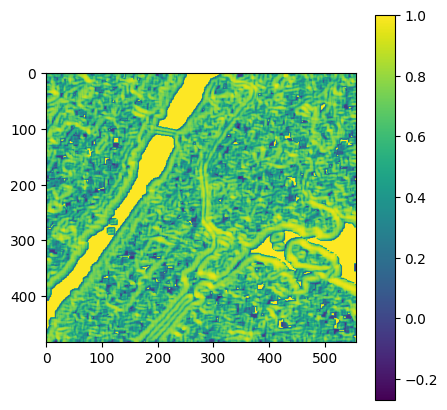

In [55]:
lwir11_contrast = extract_glcm(lwir11, size=4)
# lwir11_contrast.shape
# - extract_glcm(lwir11, size=1)

plt.figure(figsize=(5, 5))
im = plt.imshow(lwir11_contrast[0], cmap='viridis')
fig.colorbar(im)

100%|██████████| 483/483 [01:02<00:00,  7.70it/s]


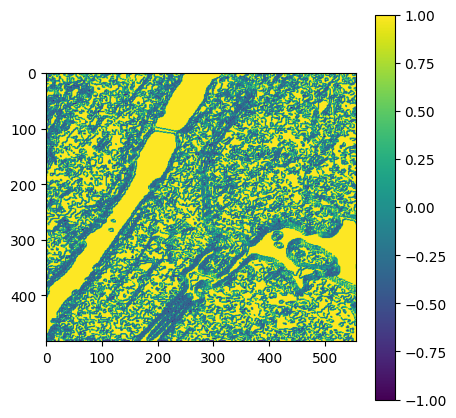

In [52]:
lwir11_contrast = extract_glcm(lwir11, size=1)
# lwir11_contrast.shape
# - extract_glcm(lwir11, size=1)

plt.figure(figsize=(5, 5))
im = plt.imshow(lwir11_contrast[1], cmap='viridis')
fig.colorbar(im)

#### Building bands

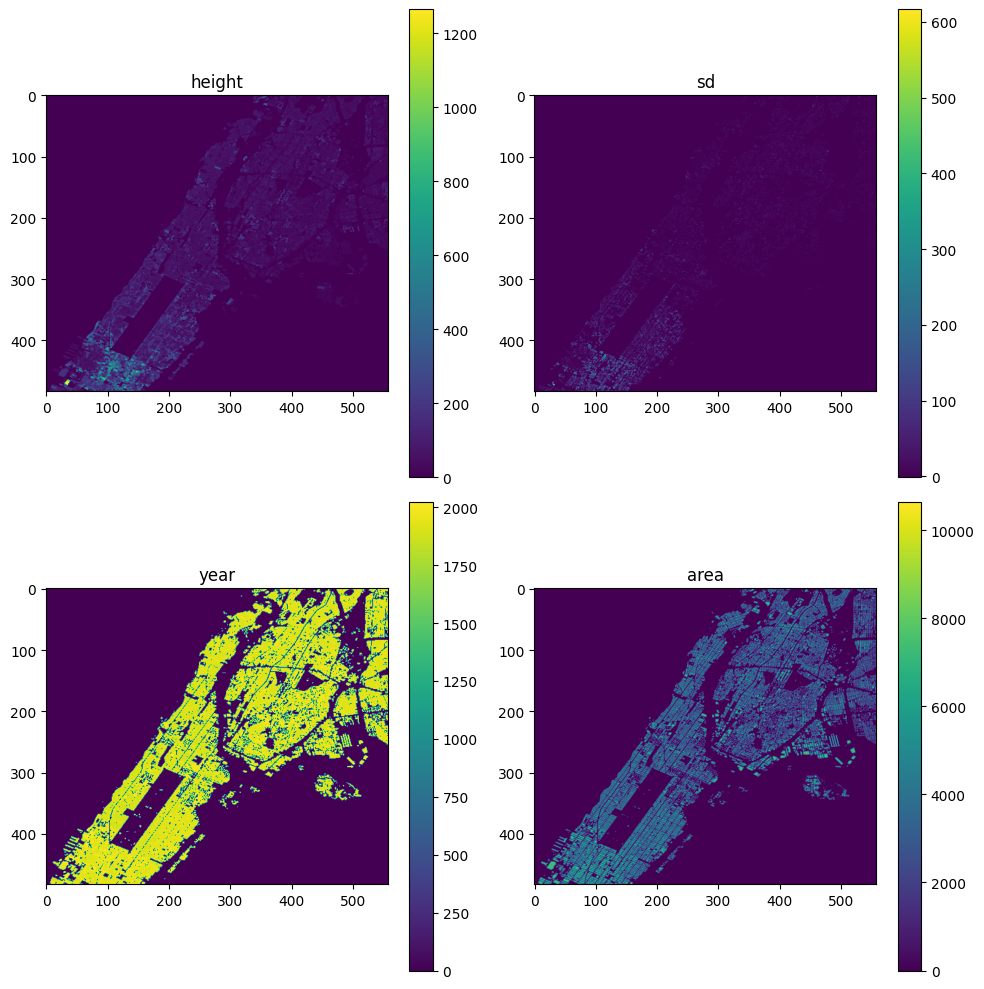

In [48]:
# Open the GeoTIFF file
tiff_path = "../data_pipeline/data/tiff/1x1/building_res30.tiff"

# Read the bands from the GeoTIFF file
with rasterio.open(tiff_path) as dst:
    building_height = dst.read(1)
    building_sd = dst.read(2)
    building_year = dst.read(3)
    building_area = dst.read(4)
    desc = dst.descriptions

band_name = ['height', 'sd', 'year', 'area']
band_lst = [building_height, building_sd, building_year, building_area]
fig, axes = plt.subplots(2, 2, figsize=(10, 10))

# Flatten the axes for easier indexing
axes = axes.flatten()

for i in range(len(band_lst)):
    im = axes[i].imshow(band_lst[i], cmap='viridis')
    axes[i].set_title(band_name[i])
    fig.colorbar(im, ax=axes[i])

plt.tight_layout()
plt.show()


In [21]:
desc

('building_height_res30',
 'building_height_std_res30',
 'building_year_res30',
 'building_area_res30')

#### Street bands

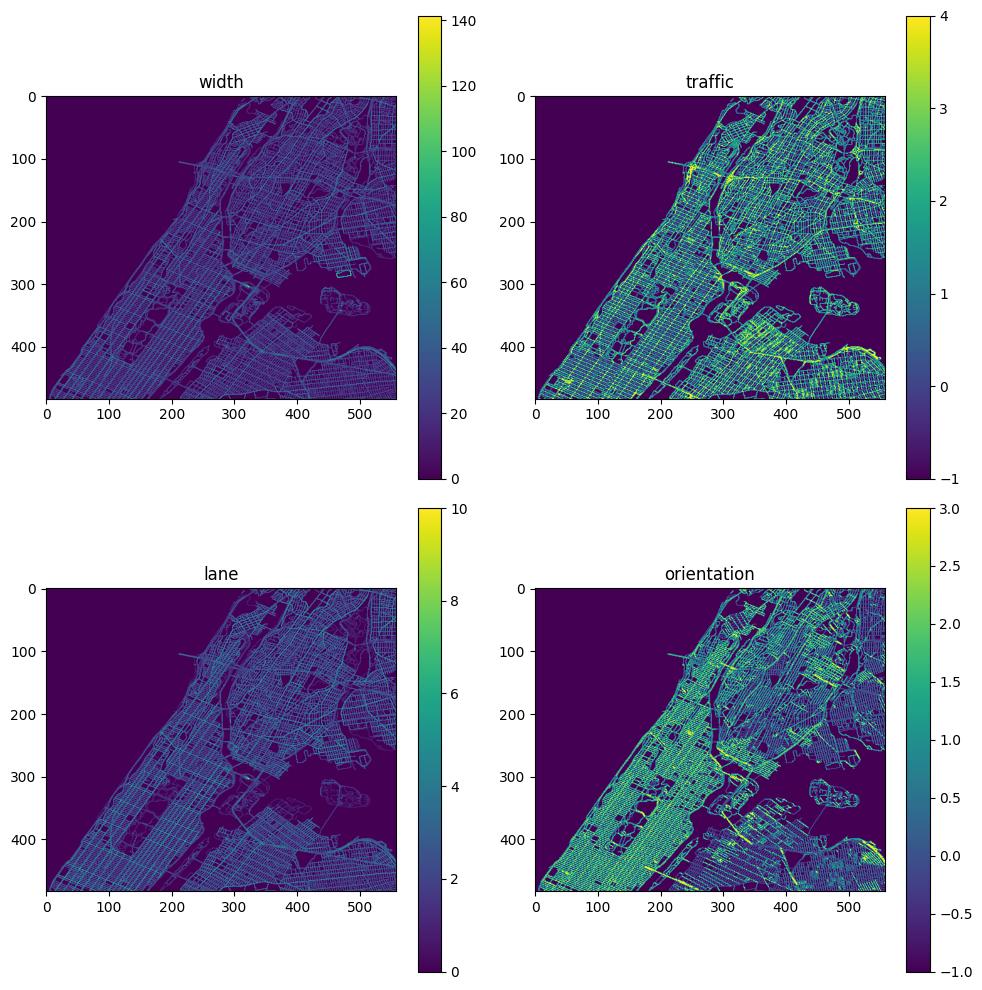

In [54]:
# Open the GeoTIFF file
tiff_path = "../data_pipeline/data/tiff/1x1/street_res30.tiff"

# Read the bands from the GeoTIFF file
with rasterio.open(tiff_path) as dst:
    street_width = dst.read(1)
    traffic_dir = dst.read(2)
    street_lane = dst.read(3)
    orientation = dst.read(4)

fig, axes = plt.subplots(2, 2, figsize=(10, 10))

band_lst = [street_width, traffic_dir, street_lane, orientation]
band_name = ['width', 'traffic', 'lane', 'orientation']

# Flatten the axes for easier indexing
axes = axes.flatten()

for i in range(len(band_lst)):
    im = axes[i].imshow(band_lst[i], cmap='viridis')
    axes[i].set_title(band_name[i])
    fig.colorbar(im, ax=axes[i])

plt.tight_layout()
plt.show()


#### Zoning bands

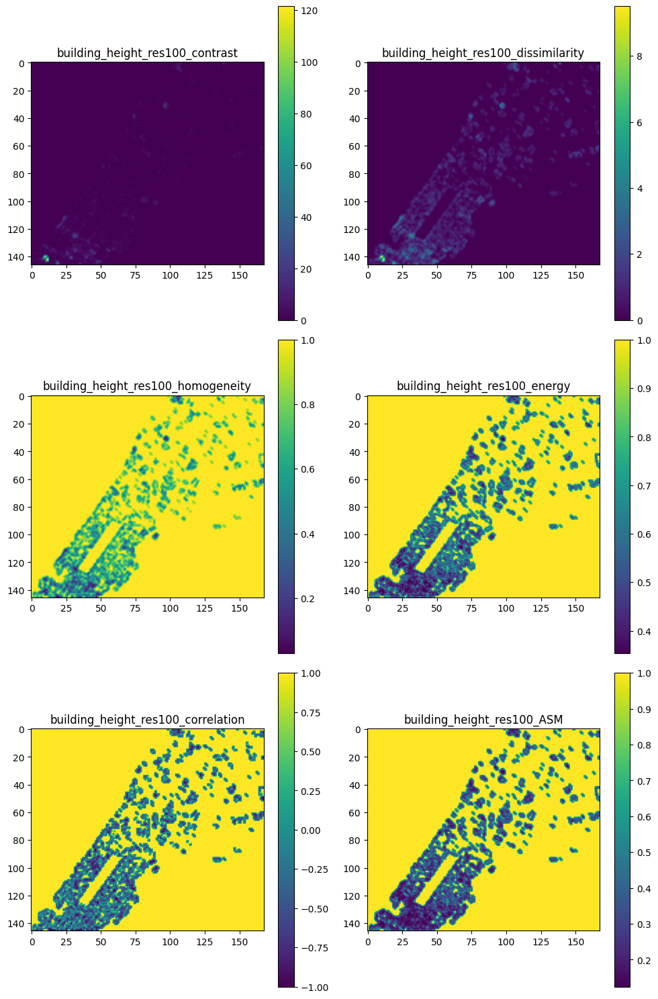

In [47]:
# Open the GeoTIFF file
tiff_path = "../data_pipeline/data/tiff/3x3/3x3_glcm_building_res100.tiff"

# Read the bands from the GeoTIFF file
with rasterio.open(tiff_path) as dst:
    b1 = dst.read(1)
    b2 = dst.read(2)
    b3 = dst.read(3)
    b4 = dst.read(4)
    b5 = dst.read(5)
    b6 = dst.read(6)
    desc = dst.descriptions

band_name = desc
band_lst = [b1, b2, b3, b4, b5, b6]
fig, axes = plt.subplots(3, 2, figsize=(10, 15))

# Flatten the axes for easier indexing
axes = axes.flatten()

for i in range(len(band_lst)):
    im = axes[i].imshow(band_lst[i], cmap='viridis')
    axes[i].set_title(band_name[i])
    fig.colorbar(im, ax=axes[i])

plt.tight_layout()
plt.show()


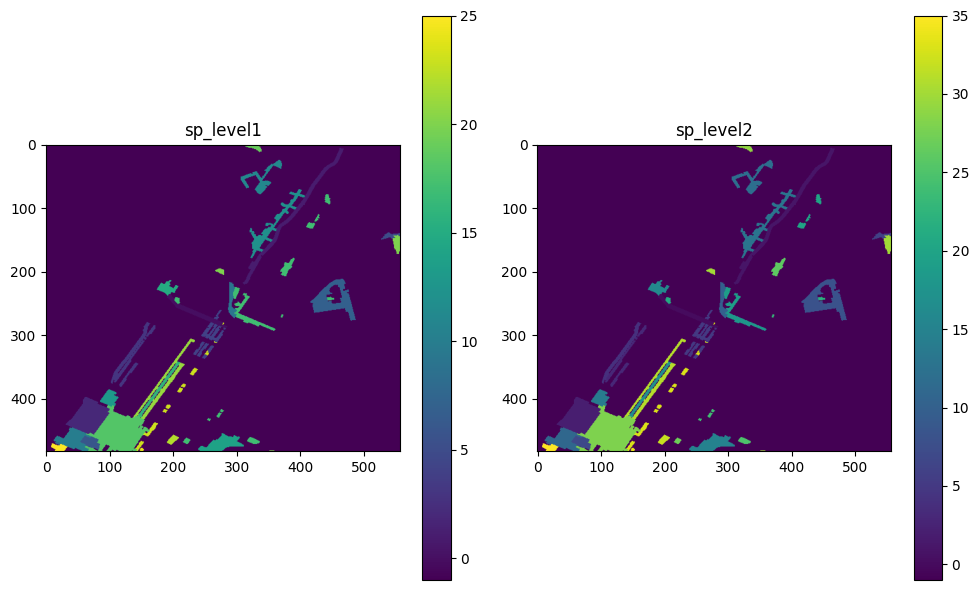

In [8]:
# Open the GeoTIFF file
tiff_path = "../data_pipeline/data/tiff/nysp_res30.tiff"

# Read the bands from the GeoTIFF file
with rasterio.open(tiff_path) as dst:
    sp_level1 = dst.read(1)
    sp_level2 = dst.read(2)

band_name = ['sp_level1', 'sp_level2'] 
band_lst = [sp_level1, sp_level2]
fig, axes = plt.subplots(1, 2, figsize=(10, 6))

# Flatten the axes for easier indexing
axes = axes.flatten()

for i in range(len(band_lst)):
    im = axes[i].imshow(band_lst[i], cmap='viridis')
    axes[i].set_title(band_name[i])
    fig.colorbar(im, ax=axes[i])

plt.tight_layout()
plt.show()


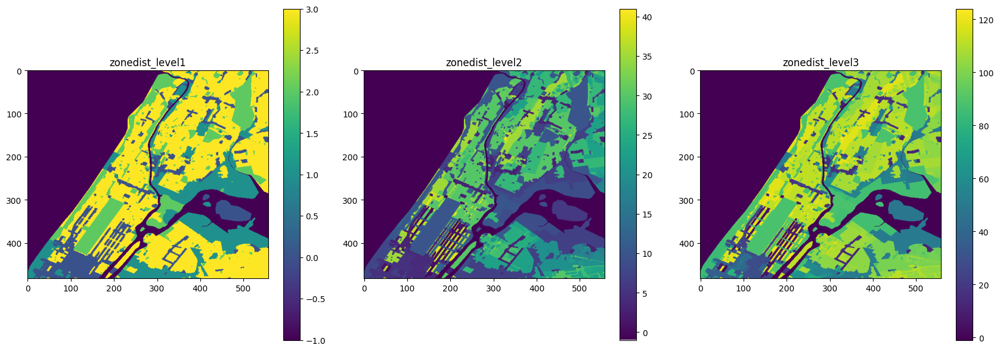

In [9]:
# Open the GeoTIFF file
tiff_path = "../data_pipeline/data/tiff/nyzd_res30.tiff"

# Read the bands from the GeoTIFF file
with rasterio.open(tiff_path) as dst:
    zonedist_level1 = dst.read(1)
    zonedist_level2 = dst.read(2)
    zonedist_level3 = dst.read(3)

band_name = ['zonedist_level1', 'zonedist_level2', 'zonedist_level3'] 
band_lst = [zonedist_level1, zonedist_level2, zonedist_level3]
fig, axes = plt.subplots(1, 3, figsize=(17, 6))

# Flatten the axes for easier indexing
axes = axes.flatten()

for i in range(len(band_lst)):
    im = axes[i].imshow(band_lst[i], cmap='viridis')
    axes[i].set_title(band_name[i])
    fig.colorbar(im, ax=axes[i])

plt.tight_layout()
plt.show()


In [19]:
residence_100

array([[278.1493  , 277.1493  , 276.1493  , ...,   0.      ,   0.      ,
          0.      ],
       [277.73508 , 276.73508 , 275.73508 , ...,   0.      ,   0.      ,
          0.      ],
       [277.32086 , 276.32086 , 275.32086 , ...,   0.      ,   0.      ,
          0.      ],
       ...,
       [ 27.828426,  26.828426,  25.828426, ...,   0.      ,   0.      ,
          0.      ],
       [ 27.414213,  26.414213,  25.414213, ...,   0.      ,   0.      ,
          0.      ],
       [ 27.      ,  26.      ,  25.      , ...,   0.      ,   0.      ,
          0.      ]], dtype=float32)

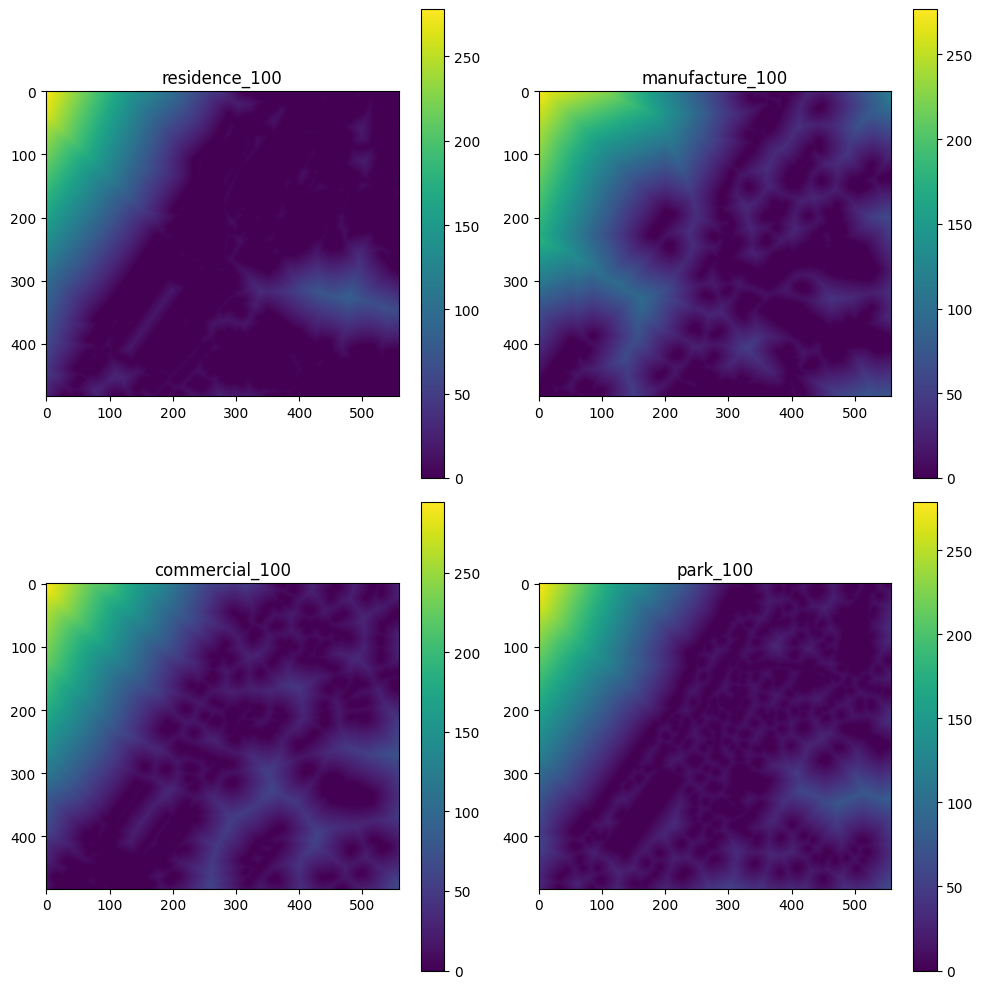

In [18]:
# Open the GeoTIFF file
tiff_path = "../data_pipeline/data/tiff/1x1/zoning_res30_distance.tiff"

# Read the bands from the GeoTIFF file
with rasterio.open(tiff_path) as dst:
    residence_100 = dst.read(1)
    manufacture_100 = dst.read(2)
    commercial_100 = dst.read(3)
    park_100 = dst.read(4)

band_name = ['residence_100', 'manufacture_100', 'commercial_100', 'park_100'] 
band_lst = [residence_100, manufacture_100, commercial_100, park_100]
fig, axes = plt.subplots(2, 2, figsize=(10, 10))

# Flatten the axes for easier indexing
axes = axes.flatten()

for i in range(len(band_lst)):
    im = axes[i].imshow(band_lst[i], cmap='viridis')
    axes[i].set_title(band_name[i])
    fig.colorbar(im, ax=axes[i])

plt.tight_layout()
plt.show()


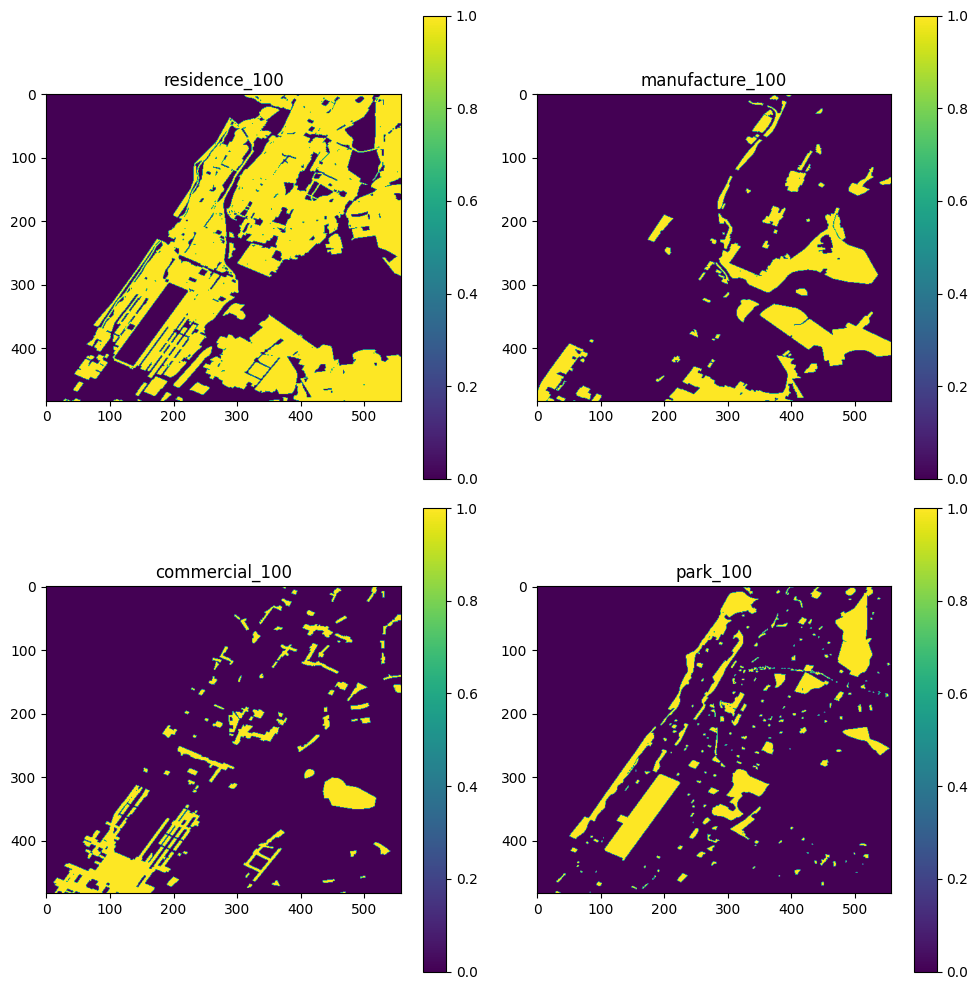

In [15]:
# Open the GeoTIFF file
tiff_path = "../data_pipeline/data/tiff/1x1/nyzd_res30.tiff"

# Read the bands from the GeoTIFF file
with rasterio.open(tiff_path) as dst:
    residence_100 = dst.read(4)
    manufacture_100 = dst.read(5)
    commercial_100 = dst.read(6)
    park_100 = dst.read(7)

band_name = ['residence_100', 'manufacture_100', 'commercial_100', 'park_100'] 
band_lst = [residence_100, manufacture_100, commercial_100, park_100]
fig, axes = plt.subplots(2, 2, figsize=(10, 10))

# Flatten the axes for easier indexing
axes = axes.flatten()

for i in range(len(band_lst)):
    im = axes[i].imshow(band_lst[i], cmap='viridis')
    axes[i].set_title(band_name[i])
    fig.colorbar(im, ax=axes[i])

plt.tight_layout()
plt.show()


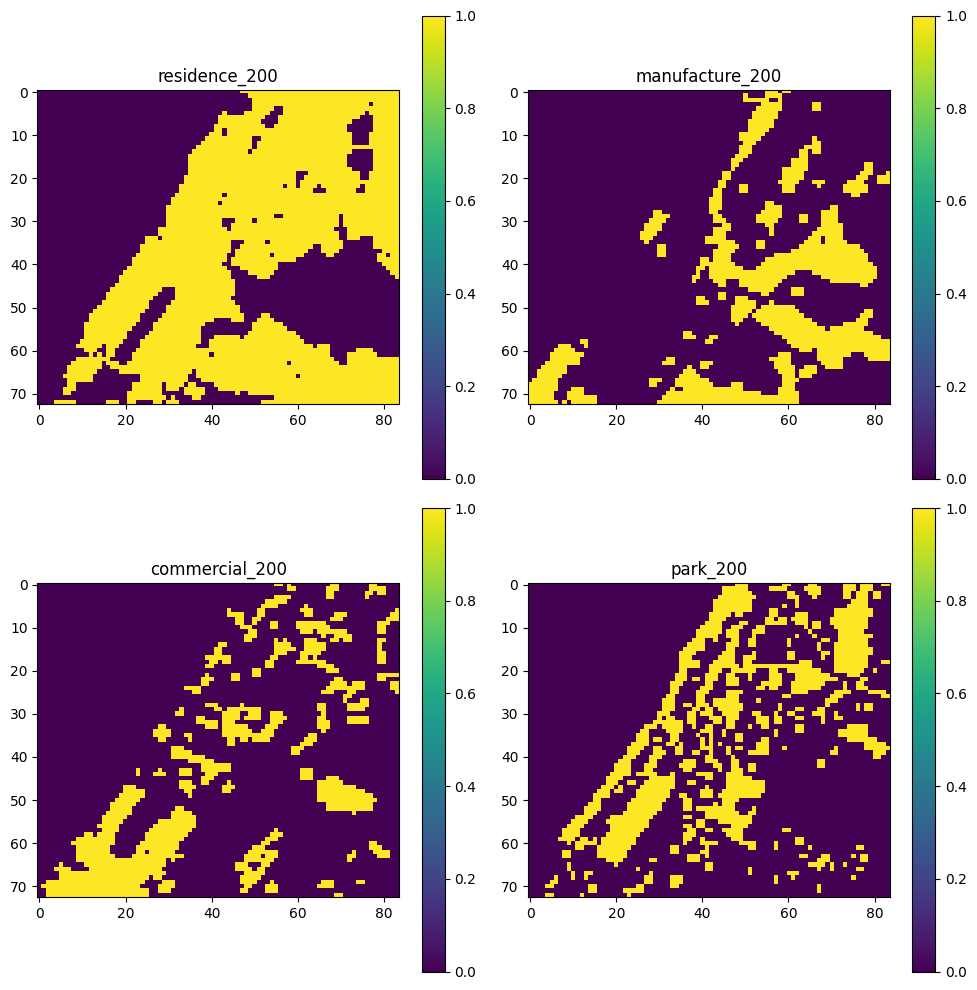

In [11]:
# Open the GeoTIFF file
tiff_path = "../data_pipeline/data/tiff/nyzd_res200.tiff"

# Read the bands from the GeoTIFF file
with rasterio.open(tiff_path) as dst:
    residence_200 = dst.read(4)
    manufacture_200 = dst.read(5)
    commercial_200 = dst.read(6)
    park_200 = dst.read(7)

band_name = ['residence_200', 'manufacture_200', 'commercial_200', 'park_200'] 
band_lst = [residence_200, manufacture_200, commercial_200, park_200]
fig, axes = plt.subplots(2, 2, figsize=(10, 10))

# Flatten the axes for easier indexing
axes = axes.flatten()

for i in range(len(band_lst)):
    im = axes[i].imshow(band_lst[i], cmap='viridis')
    axes[i].set_title(band_name[i])
    fig.colorbar(im, ax=axes[i])

plt.tight_layout()
plt.show()

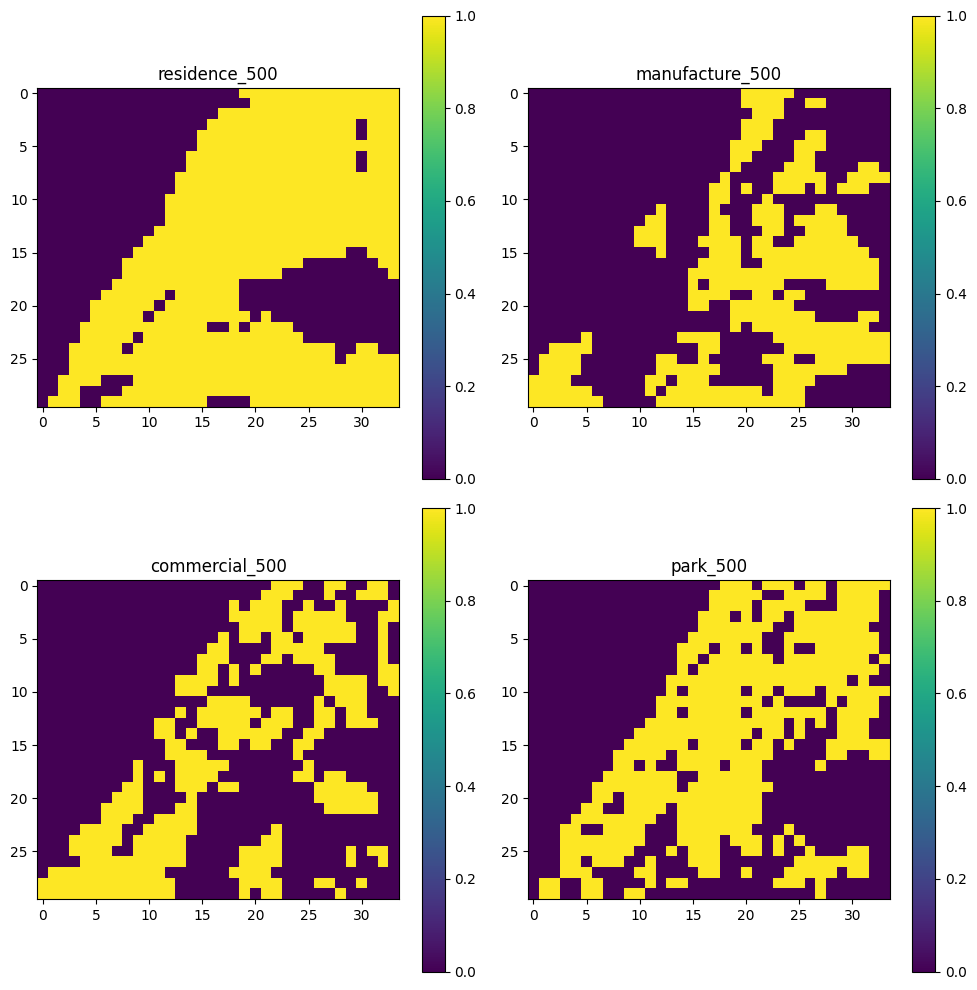

In [12]:
# Open the GeoTIFF file
tiff_path = "../data_pipeline/data/tiff/nyzd_res500.tiff"

# Read the bands from the GeoTIFF file
with rasterio.open(tiff_path) as dst:
    residence_500 = dst.read(4)
    manufacture_500 = dst.read(5)
    commercial_500 = dst.read(6)
    park_500 = dst.read(7)

band_name = ['residence_500', 'manufacture_500', 'commercial_500', 'park_500'] 
band_lst = [residence_500, manufacture_500, commercial_500, park_500]
fig, axes = plt.subplots(2, 2, figsize=(10, 10))

# Flatten the axes for easier indexing
axes = axes.flatten()

for i in range(len(band_lst)):
    im = axes[i].imshow(band_lst[i], cmap='viridis')
    axes[i].set_title(band_name[i])
    fig.colorbar(im, ax=axes[i])

plt.tight_layout()
plt.show()

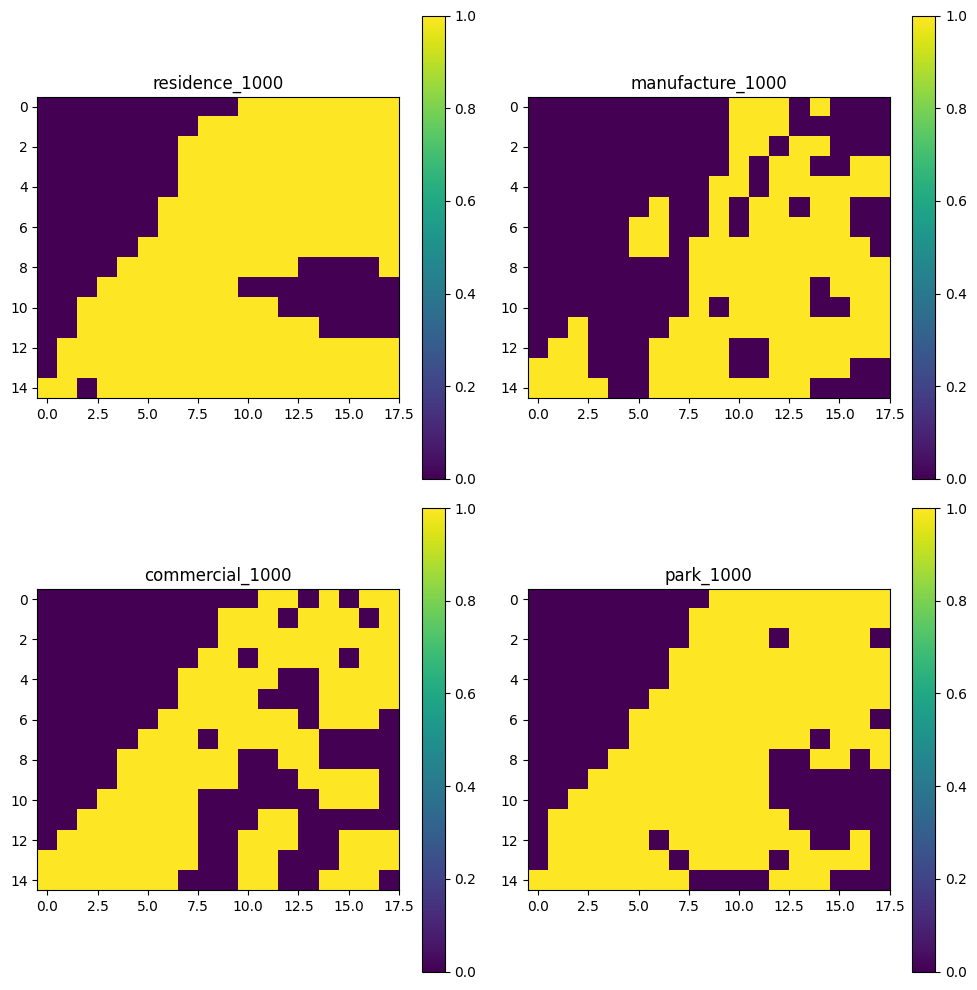

In [13]:
# Open the GeoTIFF file
tiff_path = "../data_pipeline/data/tiff/nyzd_res1000.tiff"

# Read the bands from the GeoTIFF file
with rasterio.open(tiff_path) as dst:
    residence_1000 = dst.read(4)
    manufacture_1000 = dst.read(5)
    commercial_1000 = dst.read(6)
    park_1000 = dst.read(7)

band_name = ['residence_1000', 'manufacture_1000', 'commercial_1000', 'park_1000'] 
band_lst = [residence_1000, manufacture_1000, commercial_1000, park_1000]
fig, axes = plt.subplots(2, 2, figsize=(10, 10))

# Flatten the axes for easier indexing
axes = axes.flatten()

for i in range(len(band_lst)):
    im = axes[i].imshow(band_lst[i], cmap='viridis')
    axes[i].set_title(band_name[i])
    fig.colorbar(im, ax=axes[i])

plt.tight_layout()
plt.show()

In [60]:
read_folder = "../data_pipeline/data/tiff/1x1/aod_median.tiff"
aod47_lst = []
aod55_lst = []


with rasterio.open(read_folder) as dst:
    aod_47 = dst.read(1)
    aod_55 = dst.read(2)
    # aod_uncertainty = dst.read(3)
    # aod_qa = dst.read(4)
    transform = dst.transform
    crs = dst.crs

In [24]:
meta

{'driver': 'GTiff',
 'dtype': 'float64',
 'nodata': None,
 'width': 557,
 'height': 483,
 'count': 8,
 'crs': CRS.from_wkt('GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84",6378137,298.257223563,AUTHORITY["EPSG","7030"]],AUTHORITY["EPSG","6326"]],PRIMEM["Greenwich",0,AUTHORITY["EPSG","8901"]],UNIT["degree",0.0174532925199433,AUTHORITY["EPSG","9122"]],AXIS["Latitude",NORTH],AXIS["Longitude",EAST],AUTHORITY["EPSG","4326"]]'),
 'transform': Affine(0.0002692998204667966, 0.0, -74.01,
        0.0, -0.0002691511387163614, 40.88)}

In [76]:
aod47_median = np.nanmedian(np.array(aod47_lst), axis=0)
aod55_median = np.nanmedian(np.array(aod55_lst), axis=0)

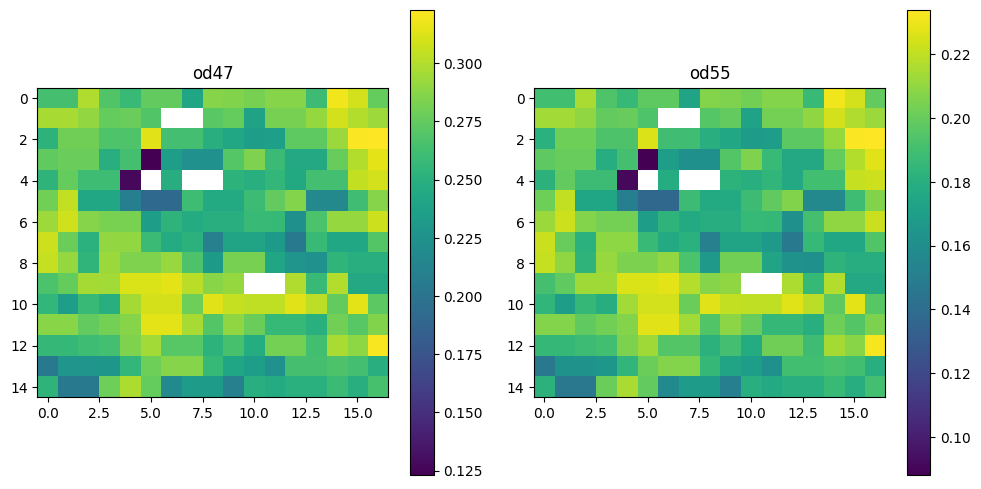

In [77]:
band_name = ['od47', 'od55'] 
band_lst = [aod47_median, aod55_median]
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Flatten the axes for easier indexing
axes = axes.flatten()

for i in range(len(band_lst)):
    im = axes[i].imshow(band_lst[i], cmap='viridis')
    axes[i].set_title(band_name[i])
    fig.colorbar(im, ax=axes[i])

plt.tight_layout()
plt.show()


In [79]:
def nanmean_filter(matrix):
    nan_mask = np.isnan(matrix)
    filled_matrix = np.copy(matrix)

    # Compute mean using convolution (excluding NaNs)
    for i in range(matrix.shape[0]):
        for j in range(matrix.shape[1]):
            if nan_mask[i, j]:  # If NaN, replace with local mean
                neighbors = []
                
                for di, dj in [(-1, 0), (1, 0), (0, -1), (0, 1)]:  # Up, Down, Left, Right
                    ni, nj = i + di, j + dj
                    if 0 <= ni < matrix.shape[0] and 0 <= nj < matrix.shape[1]:
                        if not np.isnan(matrix[ni, nj]):
                            neighbors.append(matrix[ni, nj])

                if neighbors:
                    filled_matrix[i, j] = np.nanmean(neighbors)  # Replace with neighbor mean

    return filled_matrix

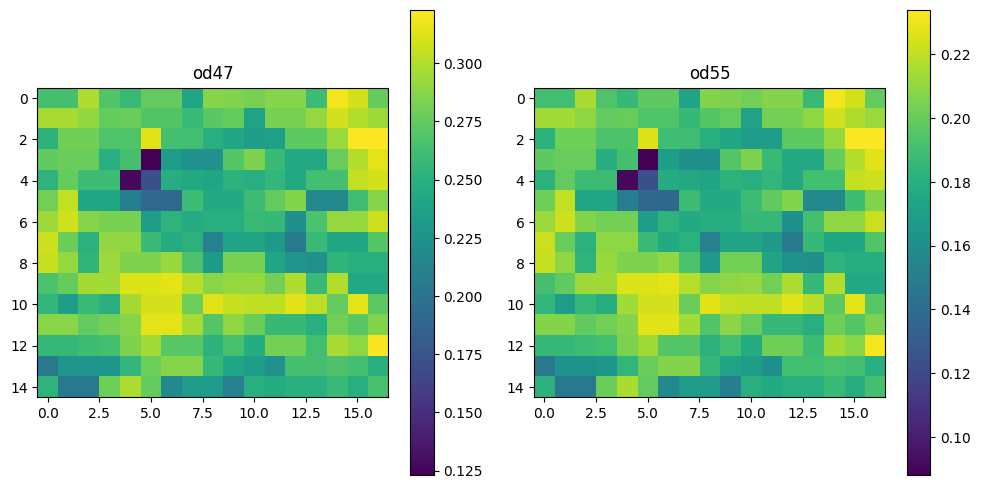

In [81]:
filled_aod55 = nanmean_filter(aod55_median)
filled_aod47 = nanmean_filter(aod47_median)

band_name = ['od47', 'od55'] 
band_lst = [filled_aod47, filled_aod55]
fig, axes = plt.subplots(1, 2, figsize=(10, 5))

# Flatten the axes for easier indexing
axes = axes.flatten()

for i in range(len(band_lst)):
    im = axes[i].imshow(band_lst[i], cmap='viridis')
    axes[i].set_title(band_name[i])
    fig.colorbar(im, ax=axes[i])

plt.tight_layout()
plt.show()


In [91]:
save_folder = "../data_pipeline/data/tiff/air_quality/AOD/"
filename = "AOD_median_3months.tif"
savefile = os.path.join(save_folder, filename)
with rasterio.open(savefile, 'w', driver='GTiff', count=2, crs=crs, transform=transform,
        dtype=filled_aod47.dtype,
        height=filled_aod47.shape[0], width=filled_aod47.shape[1]) as dst:
    dst.write(filled_aod47, 1)
    dst.write(filled_aod55, 2)

In [156]:
print(transform)

| 0.00, 0.00,-74.01|
| 0.00,-0.00, 40.88|
| 0.00, 0.00, 1.00|


In [74]:
desc

('building_height_res100_std_dev_3x3',
 'building_height_std_res100_std_dev_3x3',
 'building_year_res100_std_dev_3x3',
 'building_area_res100_std_dev_3x3')

In [98]:
desc

('aod47_std_dev_5x5', 'aod55_std_dev_5x5')

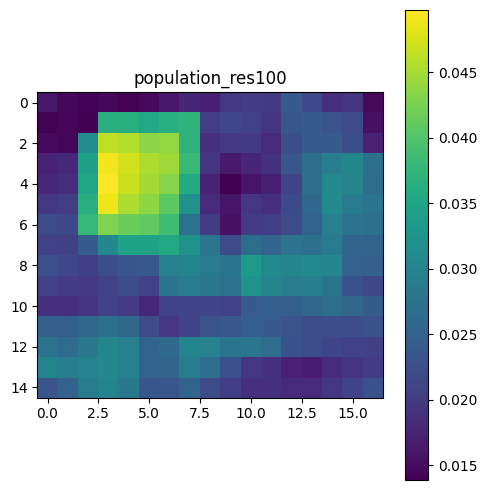

In [97]:
# Open the GeoTIFF file
tiff_path = "../data_pipeline/data/tiff/5x5/5x5_std_dev_aod_median.tiff"

# Read the bands from the GeoTIFF file
with rasterio.open(tiff_path) as dst:
    population_res100 = dst.read(1)
    desc = dst.descriptions

band_name = ['population_res100'] 
band_lst = [population_res100]
fig, axes = plt.subplots(1, 1, figsize=(5, 5))

# Flatten the axes for easier indexing
# axes = axes.flatten()

for i in range(len(band_lst)):
    im = axes.imshow(band_lst[i], cmap='viridis')
    axes.set_title(band_name[i])
    fig.colorbar(im, ax=axes)

plt.tight_layout()
plt.show()

In [68]:
def smoothing_filter(raster_arr, operation, size=1):  # 3x3: size = 1, 5x5: size = 2
    m, n = raster_arr.shape
    smoothed_raster = np.zeros((m, n))

    for i in range(m):
        for j in range(n):
            neighbors = raster_arr[max(i-size, 0):min(i+1+size, m), max(j-size, 0):min(j+1+size, n)]
            if operation == "mean":
                smoothed_raster[i, j] = np.nanmean(neighbors)
            elif operation == "std_dev":
                smoothed_raster[i, j] = np.nanstd(neighbors)
            elif operation == "median":
                smoothed_raster[i, j] = np.nanmedian(neighbors)
            else:
                print("Only except mean, median, and std_dev operation.")

    return smoothed_raster

smoothed_raster = smoothing_filter(population_res100, 'mean', size=1)

In [69]:
population_res100[140:, 5:10]

array([[  0.      ,   0.      ,   0.      ,  80.      ,  80.      ],
       [ 22.      ,   0.      ,   0.      , 155.      , 483.66666 ],
       [  0.      , 245.03667 , 245.03667 , 252.44666 , 707.      ],
       [ 84.133415, 100.22342 , 137.49083 , 125.73055 , 259.5     ],
       [126.305695,  81.5817  ,  85.2834  ,  84.8884  , 128.55    ],
       [103.13976 ,  85.43651 ,  66.466515,  63.639744,  94.      ]],
      dtype=float32)

In [70]:
print(smoothed_raster[140:, 5:10])

[[  4.88888884   2.44444442  40.31887817 111.83738708 350.61517334]
 [ 32.1151886   56.89704132 108.61333466 222.57220459 512.67926025]
 [ 74.7926178   92.65789032 140.10720825 262.87460327 485.22335815]
 [112.52825165 122.78797913 150.85758972 225.10295105 327.97579956]
 [118.11265564  96.67346954  92.30456543 116.17215729 170.77503967]
 [113.15283203  91.368927    77.88271332  87.13800812 102.1796875 ]]


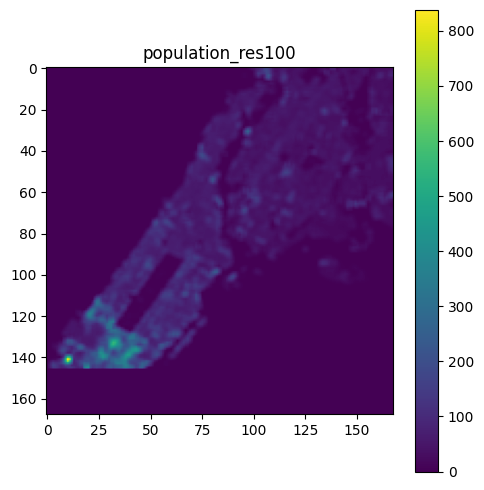

In [64]:
fig, axes = plt.subplots(1, 1, figsize=(5, 5))

im = axes.imshow(smoothed_raster, cmap='viridis')
axes.set_title(band_name[i])
fig.colorbar(im, ax=axes)

plt.tight_layout()
plt.show()

In [56]:
print(population_res100[80:85, 80:85])

[[ 55.046173  48.813957  60.691154  74.899605 105.63098 ]
 [ 52.79647   45.33286   78.46      66.710175   0.      ]
 [ 39.76      61.47333   77.9       63.77       0.      ]
 [ 56.191574  75.627884  76.57      51.84791   37.533333]
 [ 56.751503  62.21525   87.7991    94.40749   43.88215 ]]


In [58]:
print(population_res100[80:85, 80:85])

[[50.281536 48.563675 49.27393  48.949753 48.19335 ]
 [61.923992 51.381737 49.47956  48.076046 48.9608  ]
 [85.00849  66.5916   57.133877 48.986706 50.840828]
 [96.83385  72.45162  58.795696 44.49922  53.03185 ]
 [85.907845 62.851387 45.95196  28.629774 46.480305]]


In [36]:
desc

('no2_july24',)

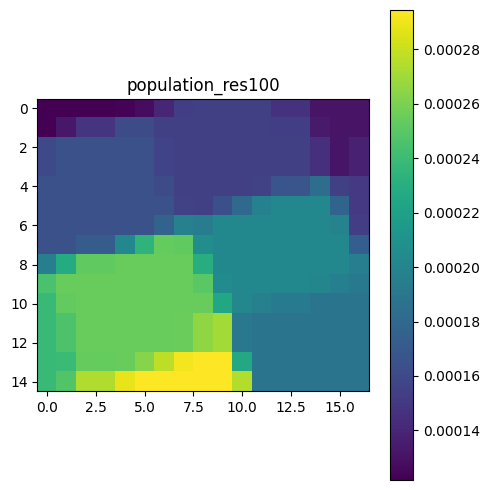

In [35]:
# Open the GeoTIFF file
tiff_path = "../data_pipeline/data/tiff/no2_20210724_165223.tif"

# Read the bands from the GeoTIFF file
with rasterio.open(tiff_path) as dst:
    population_res100 = dst.read(1)
    desc = dst.descriptions
    count = dst.count

band_name = ['population_res100'] 
band_lst = [population_res100]
fig, axes = plt.subplots(1, 1, figsize=(5, 5))

# Flatten the axes for easier indexing
# axes = axes.flatten()

for i in range(len(band_lst)):
    im = axes.imshow(band_lst[i], cmap='viridis')
    axes.set_title(band_name[i])
    fig.colorbar(im, ax=axes)

plt.tight_layout()
plt.show()

### Extracting Band Values from the GeoTIFF Image


In [83]:
training_data_path = '../Training_data_uhi_index_2025-02-18.csv'
# Mapping satellite data with training data.
data_dir = "../data_pipeline/data/tiff/"


In [84]:
# Extracts satellite band values from a GeoTIFF based on coordinates from a csv file and returns them in a DataFrame.

def map_satellite_data(tiff_path, csv_path, col_name):
    
    # Load the GeoTIFF data
    data = rxr.open_rasterio(tiff_path)
    layer_num = 0
    with rasterio.open(tiff_path) as dts:
        layer_num = dts.count

    # Read the Excel file using pandas
    df = pd.read_csv(csv_path)
    latitudes = df['Latitude'].values
    longitudes = df['Longitude'].values   

    df = pd.DataFrame()
    for i in tqdm(range(layer_num), desc="Go through layer"):
        values = []
        # Iterate over the latitudes and longitudes, and extract the corresponding band values
        for lat, lon in tqdm(zip(latitudes, longitudes), total=len(latitudes), desc="Mapping values"):
        # Assuming the correct dimensions are 'y' and 'x' (replace these with actual names from data.coords)
            cell_value = data.sel(x=lon, y=lat,  band=i+1, method="nearest").values
            values.append(cell_value)
        # Add column of feature
        df[col_name[i]] = values
    
    return df


#### Landsat8 bands

In [6]:
landsat_bands = ['red', 'blue', 'green', 'nir08', 'swir16', 'swir22', 'coastal', 'lwir11']
landsat_data = map_satellite_data(data_dir+'landsat_8.tiff', training_data_path,
                                landsat_bands)

Go through layer: 100%|██████████| 8/8 [02:05<00:00, 15.70s/it]


#### Building bands

In [7]:
# Mapping satellite data with training data.
building_bands = ['building_height', 'building_sd', 'building_year', 'building_area']
building_data = map_satellite_data(data_dir+'building_res30.tiff', training_data_path,
                                building_bands)

Go through layer:   0%|          | 0/4 [00:00<?, ?it/s]

Go through layer: 100%|██████████| 4/4 [01:00<00:00, 15.16s/it]


#### Street bands

In [8]:
# Mapping satellite data with training data.
street_bands = ['street_width', 'street_traffic', 'street_lane', 'street_orientation']
street_data = map_satellite_data(data_dir+'street_res30.tiff', training_data_path,
                                street_bands)

Go through layer: 100%|██████████| 4/4 [01:00<00:00, 15.05s/it]


#### Zoning bands

In [9]:
nyco_bands = ['overlay_level1', 'overlay_level2']
nyco_data = map_satellite_data(data_dir+'nyco_res30.tiff', training_data_path,
                                nyco_bands)

Go through layer: 100%|██████████| 2/2 [00:32<00:00, 16.44s/it]


In [10]:
nysp_bands = ['sp_level1', 'sp_level2']
nysp_data = map_satellite_data(data_dir+'nysp_res30.tiff', training_data_path,
                                nysp_bands)

Go through layer:   0%|          | 0/2 [00:00<?, ?it/s]

Go through layer: 100%|██████████| 2/2 [00:35<00:00, 17.99s/it]


In [11]:
nyzd30_bands = ['zonedist_level1_30', 'zonedist_level2_30', 'zonedist_level3_30', 'residence_30', 'manufacture_30', 'commercial_30', 'park_30']
nyzd30_data = map_satellite_data(data_dir+'nyzd_res30.tiff', training_data_path,
                                nyzd30_bands)

Go through layer:   0%|          | 0/7 [00:00<?, ?it/s]

Go through layer: 100%|██████████| 7/7 [01:45<00:00, 15.03s/it]


In [12]:
nyzd100_bands = ['zonedist_level1_100', 'zonedist_level2_100', 'zonedist_level3_100', 'residence_100', 'manufacture_100', 'commercial_100', 'park_100']
nyzd100_data = map_satellite_data(data_dir+'nyzd_res100.tiff', training_data_path,
                                nyzd100_bands)

Go through layer:   0%|          | 0/7 [00:00<?, ?it/s]

Go through layer: 100%|██████████| 7/7 [01:54<00:00, 16.37s/it]


In [13]:
nyzd200_bands = ['zonedist_level1_200', 'zonedist_level2_200', 'zonedist_level3_200', 'residence_200', 'manufacture_200', 'commercial_200', 'park_200']
nyzd200_data = map_satellite_data(data_dir+'nyzd_res200.tiff', training_data_path,
                                nyzd200_bands)

Go through layer: 100%|██████████| 7/7 [01:57<00:00, 16.78s/it]


In [14]:
nyzd500_bands = ['zonedist_level1_500', 'zonedist_level2_500', 'zonedist_level3_500', 'residence_500', 'manufacture_500', 'commercial_500', 'park_500']
nyzd500_data = map_satellite_data(data_dir+'nyzd_res500.tiff', training_data_path,
                                nyzd500_bands)

Go through layer: 100%|██████████| 7/7 [01:52<00:00, 16.08s/it]


In [15]:
nyzd1000_bands = ['zonedist_level1_1000', 'zonedist_level2_1000', 'zonedist_level3_1000', 'residence_1000', 'manufacture_1000', 'commercial_1000', 'park_1000']
nyzd1000_data = map_satellite_data(data_dir+'nyzd_res1000.tiff', training_data_path,
                                nyzd1000_bands)

Go through layer: 100%|██████████| 7/7 [01:51<00:00, 15.89s/it]


#### AOD bands

In [92]:
tif_path = "../data_pipeline/data/tiff/air_quality/AOD/AOD_median_3months.tif"
aod_bands = [ 
    "aod_47",
    "aod_55"
]
aod_data = map_satellite_data(csv_path=training_data_path,
                              tiff_path=tif_path,
                              col_name=aod_bands)


Go through layer: 100%|██████████| 2/2 [00:31<00:00, 15.63s/it]


#### Air Quality bands

In [93]:
aq_path = "../data_pipeline/data/tiff/air_quality/AQ/"

co_bands = ['co']
hcho_bands = ['hcho']
no2_bands = ['no2']
o3_bands = ['o3']
so2_bands = ['so2']

co_data = map_satellite_data(csv_path=training_data_path, tiff_path=aq_path+"co_20210724_165223.tif", col_name=co_bands)
hcho_data = map_satellite_data(csv_path=training_data_path, tiff_path=aq_path+"hcho_20210724_165223.tif", col_name=hcho_bands)
no2_data = map_satellite_data(csv_path=training_data_path, tiff_path=aq_path+"no2_20210724_165223.tif", col_name=no2_bands)
o3_data = map_satellite_data(csv_path=training_data_path, tiff_path=aq_path+"o3_20210724_165223.tif", col_name=o3_bands)
so2_data = map_satellite_data(csv_path=training_data_path, tiff_path=aq_path+"so2_20210724_165223.tif", col_name=so2_bands)

Go through layer: 100%|██████████| 1/1 [00:15<00:00, 15.74s/it]


In [162]:
population_data = map_satellite_data(csv_path=training_data_path, tiff_path="../data_pipeline/data/tiff/population_res1000.tiff", col_name=['population'])

Go through layer: 100%|██████████| 1/1 [00:17<00:00, 17.32s/it]


In [165]:
# aod_data.to_csv("../data_pipeline/data/tabular_data/train/aod_median_3months.csv")
# co_data.to_csv("../data_pipeline/data/tabular_data/train/co_july24.csv")
# hcho_data.to_csv("../data_pipeline/data/tabular_data/train/hcho_july24.csv")
# no2_data.to_csv("../data_pipeline/data/tabular_data/train/no2_july24.csv")
# o3_data.to_csv("../data_pipeline/data/tabular_data/train/o3_july24.csv")
# so2_data.to_csv("../data_pipeline/data/tabular_data/train/so2_july24.csv")
# population_data.to_csv("../data_pipeline/data/tabular_data/train/population_res100.csv")
population_data.to_csv("../data_pipeline/data/tabular_data/train/population_res1000.csv")

In [18]:
landsat_data.to_csv("../data_pipeline/data/tabular_data/train/landsat_res30.csv")
building_data.to_csv("../data_pipeline/data/tabular_data/train/building_res30.csv")
street_data.to_csv("../data_pipeline/data/tabular_data/train/street_res30.csv")
nyco_data.to_csv("../data_pipeline/data/tabular_data/train/nyco_res30.csv")
nysp_data.to_csv("../data_pipeline/data/tabular_data/train/nysp_res30.csv")
nyzd30_data.to_csv("../data_pipeline/data/tabular_data/train/nyzd_res30.csv")
nyzd100_data.to_csv("../data_pipeline/data/tabular_data/train/nyzd_res100.csv")
nyzd200_data.to_csv("../data_pipeline/data/tabular_data/train/nyzd_res200.csv")
nyzd500_data.to_csv("../data_pipeline/data/tabular_data/train/nyzd_res500.csv")
nyzd1000_data.to_csv("../data_pipeline/data/tabular_data/train/nyzd_res1000.csv")

### Environmental Indices


In [166]:
df = pd.read_csv('../Training_data_uhi_index_2025-02-18.csv')
df = pd.concat([df, landsat_data, building_data, street_data, nyco_data, nysp_data, nyzd30_data, nyzd100_data, nyzd200_data, nyzd500_data, nyzd1000_data,
                aod_data, co_data, hcho_data, no2_data, o3_data, so2_data, population_data], axis=1)

print(df.shape)
df.head()

(11229, 67)


,Longitude,Latitude,datetime,UHI Index,red,blue,green,nir08,swir16,swir22,...,commercial_1000,park_1000,aod_47,aod_55,co,hcho,no2,o3,so2,population
0,-73.909167,40.813107,24-07-2021 15:53,1.030289,0.0713975,0.04560249999999999,0.06952750000000002,0.20887,0.13649,0.09543249999999998,...,1.0,1.0,0.232,0.167,0.04738928286719038,0.00014126741734797417,0.0002023973211180192,0.14792844653127923,-0.00016137768398037238,13130.602418037339
1,-73.909187,40.813045,24-07-2021 15:53,1.030289,0.0713975,0.04560249999999999,0.06952750000000002,0.20887,0.13649,0.09543249999999998,...,1.0,1.0,0.232,0.167,0.04738928286719038,0.00014126741734797417,0.0002023973211180192,0.14792844653127923,-0.00016137768398037238,13130.602418037339
2,-73.909215,40.812978,24-07-2021 15:53,1.023798,0.10783500000000001,0.08875,0.10676249999999998,0.23001749999999999,0.185,0.1352525,...,1.0,1.0,0.232,0.167,0.04738928286719038,0.00014126741734797417,0.0002023973211180192,0.14792844653127923,-0.00016137768398037238,13130.602418037339
3,-73.909242,40.812908,24-07-2021 15:53,1.023798,0.10783500000000001,0.08875,0.10676249999999998,0.23001749999999999,0.185,0.1352525,...,1.0,1.0,0.232,0.167,0.04738928286719038,0.00014126741734797417,0.0002023973211180192,0.14792844653127923,-0.00016137768398037238,13130.602418037339
4,-73.909257,40.812845,24-07-2021 15:53,1.021634,0.10783500000000001,0.08875,0.10676249999999998,0.23001749999999999,0.185,0.1352525,...,1.0,1.0,0.232,0.167,0.04738928286719038,0.00014126741734797417,0.0002023973211180192,0.14792844653127923,-0.00016137768398037238,13130.602418037339


In [97]:
def calculate_indices(df):
    df['ndvi'] = (df['nir08'] - df['red']) / (df['nir08'] + df['red'])

    # EVI (Enhanced Vegetation Index)
    df["evi"] = 2.5 * (df['nir08'] - df['red']) / (df['nir08'] + 6 * df['red'] - 7.5 * df['blue'] + 1 + 1e-10)

    # SAVI (Soil Adjusted Vegetation Index)
    df["savi"] = (df['nir08'] - df['red']) * 1.5 / (df['nir08'] + df['red'] + 0.5 + 1e-10)

    # GNDVI (Green Normalized Difference Vegetation Index)
    df["gndvi"] = (df['nir08'] - df['green']) / (df['nir08'] + df['green'] + 1e-10)

    # ARVI (Atmospherically Resistant Vegetation Index)
    df["arvi"] = (df['nir08'] - (df['red'] - (df['blue'] - df['red']))) / (df['nir08'] + (df['red'] - (df['blue'] - df['red'])) + 1e-10)

    # MSAVI (Modified Soil-Adjusted Vegetation Index)
    df["msavi"] = (2 * df['nir08'] + 1 - ((2 * df['nir08'] + 1) ** 2 - 8 * (df['nir08'] - df['red'])) ** 0.5) / 2

    # NDWI (Normalized Difference Water Index)
    df['ndwi'] = (df['green'] - df['nir08']) / (df['green'] + df['nir08'])

    # MNDWI (Modified Normalized Difference Water Index)
    df["mndwi"] = (df['green'] - df['swir16']) / (df['green'] + df['swir16'] + 1e-10)

    # AWEI_NSH (Automated Water Extraction Index - No Shadows)
    df["awei_nsh"] = 4 * (df['green'] - df['swir16']) - (0.25 * df['nir08'] + 2.75 * df['swir22'])

    # AWEI_SH (Automated Water Extraction Index - Shadows)
    df["awei_sh"] = df['green'] + 2.5 * df['nir08'] - 1.5 * (df['swir16'] + df['swir22']) - 0.25 * df['blue']

    # NDSI (Normalized Difference Snow Index)
    df["ndsi"] = (df['green'] - df['swir16']) / (df['green'] + df['swir16'] + 1e-10)

    # NBR (Normalized Burn Ratio)
    df["nbr"] = (df['nir08'] - df['swir22']) / (df['nir08'] + df['swir22'] + 1e-10)

    # SI (Shadow Index or Soil Index)
    df["si"] = (df['swir16'] - df['blue']) / (df['swir16'] + df['blue'] + 1e-10)
        
    # NDBI (Normalized Difference Building Index)
    df['ndbi'] = (df['swir16'] - df['nir08']) / (df['swir16'] + df['nir08'])

    # UI (Urban Index)
    df["ui"] = (df['swir16'] - df['red']) / (df['swir16'] + df['red'] + 1e-10)

    # IBI (Index-based Built-up Index)
    df["ibi"] = (df["ndbi"] - (df["savi"] + df["mndwi"])) / (df["ndbi"] + (df["savi"] + df["mndwi"]) + 1e-10)
                                                            
    # Albedo (Surface Reflectance Index)
    df['albedo'] = (0.356 * df['blue'] + 0.130 * df['red'] + 0.373 * df['nir08'] + 0.085 * df['swir16'] + 0.072 * df['swir22'] - 0.018) / 1.016

    # Calculate the VAR (Vertical Aspect Ratio)
    df['var'] = df['building_height'] / df['street_width']
    df['var'] = df['var'].replace([np.inf, -np.inf], np.nan)
    df['var'] = df['var'].replace(np.nan, 1000)

    # Calculate the building's area per pixel area (30 x 30 m^2)
    df['building_area_per_pixel'] = df['building_area'] / (900 * 10.764)
    df['building_area_per_pixel'] = df['building_area_per_pixel'].replace([np.inf, -np.inf], np.nan)

    return df


In [167]:
df = calculate_indices(df)
print(df.shape)
df.head()

(11229, 86)


,Longitude,Latitude,datetime,UHI Index,red,blue,green,nir08,swir16,swir22,...,awei_sh,ndsi,nbr,si,ndbi,ui,ibi,albedo,var,building_area_per_pixel
0,-73.909167,40.813107,24-07-2021 15:53,1.030289,0.0713975,0.04560249999999999,0.06952750000000002,0.20887,0.13649,0.09543249999999998,...,0.232418,-0.325033,0.372779,0.499128,-0.209578,0.313114,0.550527,0.102261,1.479545,0.09663
1,-73.909187,40.813045,24-07-2021 15:53,1.030289,0.0713975,0.04560249999999999,0.06952750000000002,0.20887,0.13649,0.09543249999999998,...,0.232418,-0.325033,0.372779,0.499128,-0.209578,0.313114,0.550527,0.102261,1.479545,0.09663
2,-73.909215,40.812978,24-07-2021 15:53,1.023798,0.10783500000000001,0.08875,0.10676249999999998,0.23001749999999999,0.185,0.1352525,...,0.17924,-0.268155,0.259438,0.351598,-0.108471,0.26351,0.374065,0.136686,0.000000,0.00000
3,-73.909242,40.812908,24-07-2021 15:53,1.023798,0.10783500000000001,0.08875,0.10676249999999998,0.23001749999999999,0.185,0.1352525,...,0.17924,-0.268155,0.259438,0.351598,-0.108471,0.26351,0.374065,0.136686,0.000000,0.00000
4,-73.909257,40.812845,24-07-2021 15:53,1.021634,0.10783500000000001,0.08875,0.10676249999999998,0.23001749999999999,0.185,0.1352525,...,0.17924,-0.268155,0.259438,0.351598,-0.108471,0.26351,0.374065,0.136686,0.000000,0.00000


## EDA

In [168]:
df = df.drop(columns=['datetime'])
df = df.astype('float')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11229 entries, 0 to 11228
Data columns (total 85 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Longitude                11229 non-null  float64
 1   Latitude                 11229 non-null  float64
 2   UHI Index                11229 non-null  float64
 3   red                      11229 non-null  float64
 4   blue                     11229 non-null  float64
 5   green                    11229 non-null  float64
 6   nir08                    11229 non-null  float64
 7   swir16                   11229 non-null  float64
 8   swir22                   11229 non-null  float64
 9   coastal                  11229 non-null  float64
 10  lwir11                   11229 non-null  float64
 11  building_height          11229 non-null  float64
 12  building_sd              11229 non-null  float64
 13  building_year            11229 non-null  float64
 14  building_area         

In [169]:
df.columns

Index(['Longitude', 'Latitude', 'UHI Index', 'red', 'blue', 'green', 'nir08',
       'swir16', 'swir22', 'coastal', 'lwir11', 'building_height',
       'building_sd', 'building_year', 'building_area', 'street_width',
       'street_traffic', 'street_lane', 'street_orientation', 'overlay_level1',
       'overlay_level2', 'sp_level1', 'sp_level2', 'zonedist_level1_30',
       'zonedist_level2_30', 'zonedist_level3_30', 'residence_30',
       'manufacture_30', 'commercial_30', 'park_30', 'zonedist_level1_100',
       'zonedist_level2_100', 'zonedist_level3_100', 'residence_100',
       'manufacture_100', 'commercial_100', 'park_100', 'zonedist_level1_200',
       'zonedist_level2_200', 'zonedist_level3_200', 'residence_200',
       'manufacture_200', 'commercial_200', 'park_200', 'zonedist_level1_500',
       'zonedist_level2_500', 'zonedist_level3_500', 'residence_500',
       'manufacture_500', 'commercial_500', 'park_500', 'zonedist_level1_1000',
       'zonedist_level2_1000', 'zonedis

In [170]:
excluded_cols = ['Longitude', 'Latitude', 'UHI Index',]
categorical_cols = ['street_traffic', 'street_orientation'] + nyco_bands + nysp_bands + nyzd30_bands + nyzd100_bands + nyzd200_bands + nyzd500_bands + nyzd1000_bands

excluded_feautures = [
    'overlay_level2', 'sp_level1', 'sp_level2', 'zonedist_level3_30', 'zonedist_level2_30', 'residence_30',
    'manufacture_30', 'commercial_30', 'park_30', 
    'zonedist_level1_100',
    'zonedist_level2_100', 'zonedist_level3_100', 'zonedist_level1_200',
    'zonedist_level2_200', 'zonedist_level3_200', 'zonedist_level1_500',
    'zonedist_level2_500', 'zonedist_level3_500', 'zonedist_level1_1000',
    'zonedist_level2_1000', 'zonedist_level3_1000'
]
df[categorical_cols] = df[categorical_cols].astype('category')

cat_col_included = list(set(categorical_cols) - set(excluded_feautures))
numerical_cols = df.columns.difference(cat_col_included + excluded_cols + excluded_feautures)

In [171]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11229 entries, 0 to 11228
Data columns (total 85 columns):
 #   Column                   Non-Null Count  Dtype   
---  ------                   --------------  -----   
 0   Longitude                11229 non-null  float64 
 1   Latitude                 11229 non-null  float64 
 2   UHI Index                11229 non-null  float64 
 3   red                      11229 non-null  float64 
 4   blue                     11229 non-null  float64 
 5   green                    11229 non-null  float64 
 6   nir08                    11229 non-null  float64 
 7   swir16                   11229 non-null  float64 
 8   swir22                   11229 non-null  float64 
 9   coastal                  11229 non-null  float64 
 10  lwir11                   11229 non-null  float64 
 11  building_height          11229 non-null  float64 
 12  building_sd              11229 non-null  float64 
 13  building_year            11229 non-null  float64 
 14  buildi

## Data Preprocesing

In [172]:
uhi_data = df.drop(columns=(['Longitude', 'Latitude'] + excluded_feautures))
uhi_data

,UHI Index,red,blue,green,nir08,swir16,swir22,coastal,lwir11,building_height,...,awei_sh,ndsi,nbr,si,ndbi,ui,ibi,albedo,var,building_area_per_pixel
0,1.030289,0.071398,0.045602,0.069528,0.208870,0.136490,0.095432,0.039250,37.785534,65.099998,...,0.232418,-0.325033,0.372779,0.499128,-0.209578,0.313114,0.550527,0.102261,1.479545,0.09663
1,1.030289,0.071398,0.045602,0.069528,0.208870,0.136490,0.095432,0.039250,37.785534,65.099998,...,0.232418,-0.325033,0.372779,0.499128,-0.209578,0.313114,0.550527,0.102261,1.479545,0.09663
2,1.023798,0.107835,0.088750,0.106762,0.230017,0.185000,0.135252,0.075742,37.358281,0.000000,...,0.179240,-0.268155,0.259438,0.351598,-0.108471,0.263510,0.374065,0.136686,0.000000,0.00000
3,1.023798,0.107835,0.088750,0.106762,0.230017,0.185000,0.135252,0.075742,37.358281,0.000000,...,0.179240,-0.268155,0.259438,0.351598,-0.108471,0.263510,0.374065,0.136686,0.000000,0.00000
4,1.021634,0.107835,0.088750,0.106762,0.230017,0.185000,0.135252,0.075742,37.358281,0.000000,...,0.179240,-0.268155,0.259438,0.351598,-0.108471,0.263510,0.374065,0.136686,0.000000,0.00000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11224,0.972470,0.064880,0.051268,0.075798,0.336745,0.182827,0.104892,0.048627,30.440209,0.000000,...,0.473263,-0.413842,0.524984,0.561994,-0.296239,0.476156,1.298300,0.154906,0.000000,0.00000
11225,0.972470,0.064880,0.051268,0.075798,0.336745,0.182827,0.104892,0.048627,30.440209,0.000000,...,0.473263,-0.413842,0.524984,0.561994,-0.296239,0.476156,1.298300,0.154906,0.000000,0.00000
11226,0.981124,0.064880,0.051268,0.075798,0.336745,0.182827,0.104892,0.048627,30.440209,0.000000,...,0.473263,-0.413842,0.524984,0.561994,-0.296239,0.476156,1.298300,0.154906,0.000000,0.00000
11227,0.981245,0.064880,0.051268,0.075798,0.336745,0.182827,0.104892,0.048627,30.440209,0.000000,...,0.473263,-0.413842,0.524984,0.561994,-0.296239,0.476156,1.298300,0.154906,0.000000,0.00000


### Removing duplicates

In [173]:
# Check the duplicated records
print(f'Duplicated Rows: {uhi_data.duplicated().sum()}')
uhi_data.columns

Duplicated Rows: 3378


Index(['UHI Index', 'red', 'blue', 'green', 'nir08', 'swir16', 'swir22',
       'coastal', 'lwir11', 'building_height', 'building_sd', 'building_year',
       'building_area', 'street_width', 'street_traffic', 'street_lane',
       'street_orientation', 'overlay_level1', 'zonedist_level1_30',
       'residence_100', 'manufacture_100', 'commercial_100', 'park_100',
       'residence_200', 'manufacture_200', 'commercial_200', 'park_200',
       'residence_500', 'manufacture_500', 'commercial_500', 'park_500',
       'residence_1000', 'manufacture_1000', 'commercial_1000', 'park_1000',
       'aod_47', 'aod_55', 'co', 'hcho', 'no2', 'o3', 'so2', 'population',
       'ndvi', 'evi', 'savi', 'gndvi', 'arvi', 'msavi', 'ndwi', 'mndwi',
       'awei_nsh', 'awei_sh', 'ndsi', 'nbr', 'si', 'ndbi', 'ui', 'ibi',
       'albedo', 'var', 'building_area_per_pixel'],
      dtype='object')

In [174]:
uhi_data = uhi_data.drop_duplicates(keep='first')

In [175]:
# Resetting the index of the dataset
uhi_data = uhi_data.reset_index(drop=True)

### Encoding

In [176]:
# One-hot encodiing
# encoder = OneHotEncoder(sparse_output=False)
# ohe = encoder.fit_transform(uhi_data[categorical_cols])
uhi_data = pd.get_dummies(uhi_data, columns=cat_col_included)
uhi_data

,UHI Index,red,blue,green,nir08,swir16,swir22,coastal,lwir11,building_height,...,manufacture_200_0.0,manufacture_200_1.0,manufacture_500_0.0,manufacture_500_1.0,commercial_100_0.0,commercial_100_1.0,park_500_0.0,park_500_1.0,manufacture_1000_0.0,manufacture_1000_1.0
0,1.030289,0.071398,0.045602,0.069528,0.208870,0.136490,0.095432,0.039250,37.785534,65.099998,...,True,False,False,True,True,False,False,True,False,True
1,1.023798,0.107835,0.088750,0.106762,0.230017,0.185000,0.135252,0.075742,37.358281,0.000000,...,True,False,False,True,True,False,False,True,False,True
2,1.021634,0.107835,0.088750,0.106762,0.230017,0.185000,0.135252,0.075742,37.358281,0.000000,...,True,False,False,True,True,False,False,True,False,True
3,1.015143,0.182663,0.112262,0.159618,0.245830,0.226635,0.187200,0.092710,37.091675,12.830000,...,True,False,False,True,True,False,False,True,False,True
4,1.012979,0.182663,0.112262,0.159618,0.245830,0.226635,0.187200,0.092710,37.091675,12.830000,...,True,False,False,True,True,False,False,True,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7846,0.972470,0.064880,0.051268,0.075798,0.336745,0.182827,0.104892,0.048627,30.440209,0.000000,...,True,False,True,False,True,False,False,True,True,False
7847,0.972470,0.064880,0.051268,0.075798,0.336745,0.182827,0.104892,0.048627,30.440209,0.000000,...,True,False,True,False,True,False,False,True,True,False
7848,0.981124,0.064880,0.051268,0.075798,0.336745,0.182827,0.104892,0.048627,30.440209,0.000000,...,True,False,True,False,True,False,False,True,True,False
7849,0.981245,0.064880,0.051268,0.075798,0.336745,0.182827,0.104892,0.048627,30.440209,0.000000,...,True,False,True,False,True,False,False,True,True,False


## Model Building

### Train and Test Split 

<p align="justify">We will now split the data into 70% training data and 30% test data. Scikit-learn alias “sklearn” is a robust library for machine learning in Python. The scikit-learn library has a <i><b>model_selection</b></i> module in which there is a splitting function <i><b>train_test_split</b></i>. You can use the same.</p>

In [177]:
# Split the data into features (X) and target (y), and then into training and testing sets
# columns = uhi_data.drop(columns=['UHI Index']).columns
# X = uhi_data[columns].values
X = uhi_data.drop(columns=['UHI Index'])
y = uhi_data['UHI Index']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3,random_state=42)

X_train

,red,blue,green,nir08,swir16,swir22,coastal,lwir11,building_height,building_sd,...,manufacture_200_0.0,manufacture_200_1.0,manufacture_500_0.0,manufacture_500_1.0,commercial_100_0.0,commercial_100_1.0,park_500_0.0,park_500_1.0,manufacture_1000_0.0,manufacture_1000_1.0
3698,0.110530,0.085560,0.107642,0.232960,0.224627,0.189428,0.083552,36.869504,131.529999,49.945187,...,True,False,True,False,False,True,True,False,True,False
605,0.126700,0.098952,0.118615,0.162615,0.169050,0.152990,0.086165,38.527244,22.100000,0.829156,...,True,False,False,True,True,False,True,False,False,True
3014,0.098265,0.073790,0.100602,0.284495,0.201198,0.135582,0.068317,33.338690,0.000000,-1.000000,...,True,False,False,True,True,False,False,True,False,True
3784,0.165888,0.116827,0.150240,0.264228,0.240743,0.202435,0.101400,34.364096,74.906670,12.995241,...,True,False,True,False,True,False,False,True,True,False
1468,0.084790,0.070242,0.073460,0.121640,0.099228,0.089218,0.070682,37.310429,0.000000,-1.000000,...,True,False,False,True,True,False,False,True,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5226,0.165998,0.071755,0.148178,0.218687,0.249405,0.232272,0.013895,37.652231,44.244999,17.334999,...,False,True,False,True,True,False,True,False,False,True
5390,0.105332,0.086303,0.096477,0.122410,0.150213,0.140257,0.076925,41.753855,14.940000,0.000000,...,False,True,False,True,True,False,True,False,False,True
860,0.055063,0.052835,0.064522,0.292278,0.156483,0.087898,0.050717,31.752728,0.000000,-1.000000,...,True,False,True,False,True,False,False,True,False,True
7603,0.138415,0.095212,0.138030,0.340320,0.235847,0.152550,0.076870,36.288441,0.000000,-1.000000,...,True,False,True,False,True,False,False,True,True,False


### Feature Scaling 

In [178]:
# Scale the training and test data using standardscaler
sc = MinMaxScaler()
X_train[numerical_cols] = sc.fit_transform(X_train[numerical_cols])
X_test[numerical_cols] = sc.transform(X_test[numerical_cols])

### Model Training

#### Random Forest

In [34]:
rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_train, y_train)

RandomForestRegressor(random_state=42)

##### In-Sample Evaluation

In [35]:
# Make predictions on the training data
insample_predictions = rf.predict(X_train)

# calculate R-squared score for in-sample predictions
Y_train = y_train.tolist()
r2_score(Y_train, insample_predictions)

0.9580175951612395

##### Out-Sample Evaluation

In [36]:
# Make predictions on the test data
outsample_predictions = rf.predict(X_test)

# calculate R-squared score for out-sample predictions
Y_test = y_test.tolist()
r2_score(Y_test, outsample_predictions)

0.7403300325411031

##### Residuals

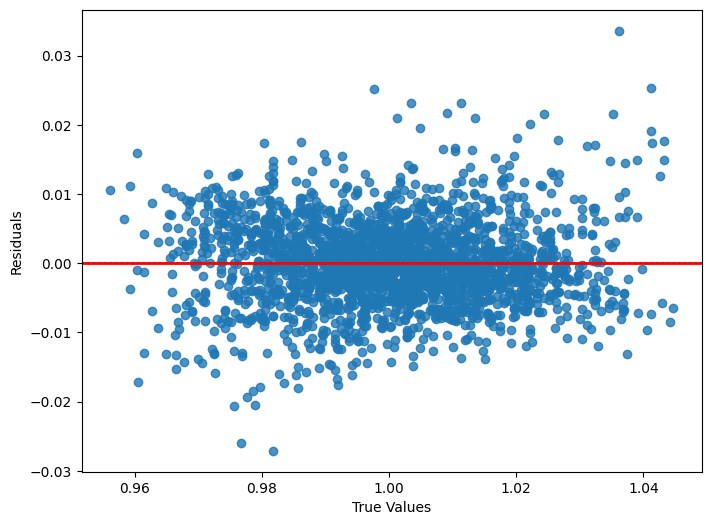

In [37]:
residuals = Y_test - outsample_predictions

plt.figure(figsize=(8, 6))
sns.residplot(x=Y_test, y=residuals, line_kws={"color": "red", "lw": 2})
plt.axhline(0, color='red', linewidth=2)
plt.xlabel("True Values")
plt.ylabel("Residuals")
plt.show()

##### Features Importance

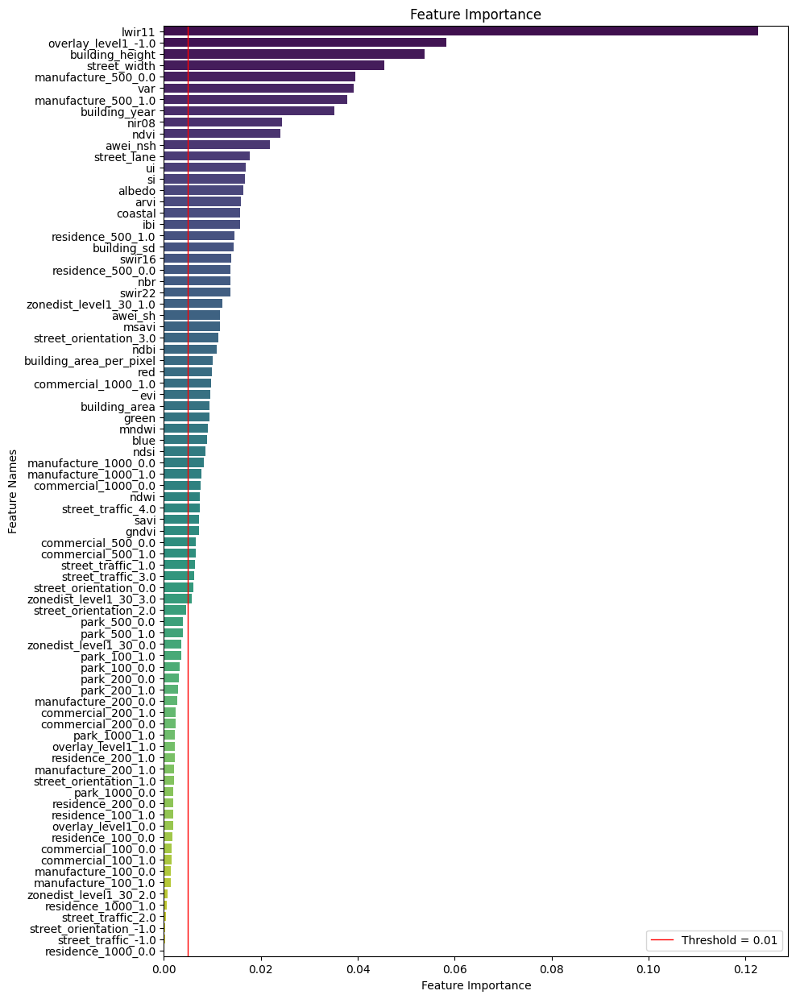

In [38]:
feature_importances = rf.feature_importances_

feature_df = pd.DataFrame({'Feature': X.columns, 'Importance': feature_importances})
feature_df = feature_df.sort_values(by="Importance", ascending=False)

plt.figure(figsize=(10, 15))
sns.barplot(x="Importance", y="Feature", data=feature_df, palette="viridis")
plt.axvline(x=0.005, color='red', linestyle='-', linewidth=1, label="Threshold = 0.01")
plt.xlabel("Feature Importance")
plt.ylabel("Feature Names")
plt.title("Feature Importance")
plt.legend()
plt.show()

In [48]:
feature_df[feature_df['Importance'] < 0.01]

,Feature,Importance
3,nir08,0.009161
16,AOD_Uncertainty,0.008299
35,awei_nsh,0.007947
181,zonedist_level3_30_111.0,0.007776
13,street_lane,0.007538
...,...,...
398,zonedist_level3_500_14.0,0.000000
21,AngstromExp_470-780,0.000000
124,zonedist_level2_30_34.0,0.000000
211,zonedist_level2_100_8.0,0.000000


#### XGB

In [179]:
xgb = XGBRegressor(
    n_estimators=500,
    learning_rate=0.05,
    max_depth=10,
    min_child_weight=5,
    colsample_bytree=1,
    subsample=0.8,
    random_state=42
)

xgb.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None, colsample_bytree=1,
             device=None, early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=0.05, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=10,
             max_leaves=None, min_child_weight=5, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=500,
             n_jobs=None, num_parallel_tree=None, random_state=42, ...)

##### In-Sample Evaluation

In [180]:
# Make predictions on the training data
insample_predictions = xgb.predict(X_train)

# calculate R-squared score for in-sample predictions
Y_train = y_train.tolist()
r2_score(Y_train, insample_predictions)

0.9905648827552795

##### Out-Sample Evaluation

In [181]:
# Make predictions on the test data
outsample_predictions = xgb.predict(X_test)

# calculate R-squared score for out-sample predictions
Y_test = y_test.tolist()
r2_score(Y_test, outsample_predictions)

0.8959559202194214

##### Residuals

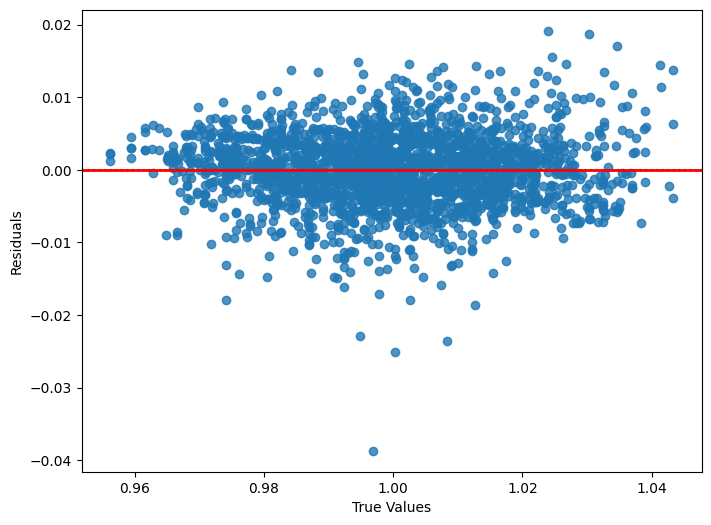

In [182]:
residuals = Y_test - outsample_predictions

plt.figure(figsize=(8, 6))
sns.residplot(x=Y_test, y=residuals, line_kws={"color": "red", "lw": 2})
plt.axhline(0, color='red', linewidth=2)
plt.xlabel("True Values")
plt.ylabel("Residuals")
plt.show()

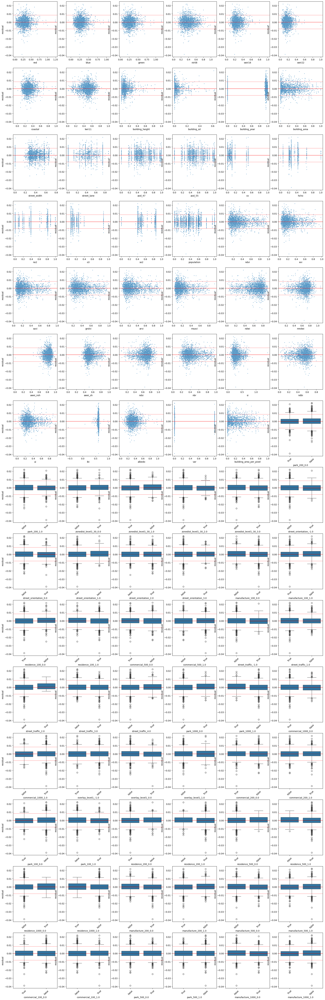

In [184]:
res_plot_df = X_test.copy()
res_plot_df['residual'] = residuals

fig, axes = plt.subplots(15, 6, figsize=(25, 80))
axes = axes.flatten()

# Iterate over all pairs
for i, col in enumerate(X_test.columns):
    ax = axes[i]

    if col in numerical_cols:
        sns.scatterplot(x=col, y="residual", data=res_plot_df, ax=ax, s=5)
    else:
        sns.boxplot(x=res_plot_df[col], y=res_plot_df['residual'], ax=ax)
        ax.set_xticklabels(res_plot_df[col].unique(), rotation=45)

    ax.axhline(0, color='red', linewidth=1)
    ax.axhline(np.percentile(residuals, 95), color='red', linewidth=0.5)
    ax.axhline(np.percentile(residuals, 5), color='red', linewidth=0.5)
    ax.set_xlabel(col)

plt.show()

## Submission

In [185]:
submission_data_path = '../Submission_template_UHI2025-v2.csv' 

In [186]:
#Reading the coordinates for the submission
test_file = pd.read_csv(submission_data_path)
test_file

,Longitude,Latitude,UHI Index
0,-73.971665,40.788763,NaN
1,-73.971928,40.788875,NaN
2,-73.967080,40.789080,NaN
3,-73.972550,40.789082,NaN
4,-73.969697,40.787953,NaN
...,...,...,...
1035,-73.919388,40.813803,NaN
1036,-73.931033,40.833178,NaN
1037,-73.934647,40.854542,NaN
1038,-73.917223,40.815413,NaN


In [187]:
# # Mapping satellite data for submission.
# val_landsat_data = map_satellite_data(data_dir + 'landsat_8.tiff', submission_data_path, landsat_bands)
# val_building_data = map_satellite_data(data_dir + 'building_res30.tiff', submission_data_path, building_bands)
# val_street_data = map_satellite_data(data_dir + 'street_res30.tiff', submission_data_path, street_bands)
# val_nyco_data = map_satellite_data(data_dir + 'nyco_res30.tiff', submission_data_path, nyco_bands)
# val_nysp_data = map_satellite_data(data_dir + 'nysp_res30.tiff', submission_data_path, nysp_bands)
# val_nyzd30_data = map_satellite_data(data_dir + 'nyzd_res30.tiff', submission_data_path, nyzd30_bands)
# val_nyzd100_data = map_satellite_data(data_dir + 'nyzd_res100.tiff', submission_data_path, nyzd100_bands)
# val_nyzd200_data = map_satellite_data(data_dir + 'nyzd_res200.tiff', submission_data_path, nyzd200_bands)
# val_nyzd500_data = map_satellite_data(data_dir + 'nyzd_res500.tiff', submission_data_path, nyzd500_bands)
# val_nyzd1000_data = map_satellite_data(data_dir + 'nyzd_res1000.tiff', submission_data_path, nyzd1000_bands)

# tif_path = "../data_pipeline/data/tiff/air_quality/AOD/AOD_median_3months.tif"
# val_aod_data = map_satellite_data(csv_path=submission_data_path,
#                               tiff_path=tif_path,
#                               col_name=aod_bands)

# val_co_data = map_satellite_data(csv_path=submission_data_path, tiff_path=aq_path+"co_20210724_165223.tif", col_name=co_bands)
# val_hcho_data = map_satellite_data(csv_path=submission_data_path, tiff_path=aq_path+"hcho_20210724_165223.tif", col_name=hcho_bands)
# val_no2_data = map_satellite_data(csv_path=submission_data_path, tiff_path=aq_path+"no2_20210724_165223.tif", col_name=no2_bands)
# val_o3_data = map_satellite_data(csv_path=submission_data_path, tiff_path=aq_path+"o3_20210724_165223.tif", col_name=o3_bands)
# val_so2_data = map_satellite_data(csv_path=submission_data_path, tiff_path=aq_path+"so2_20210724_165223.tif", col_name=so2_bands)

val_population_data = map_satellite_data(csv_path=submission_data_path, tiff_path="../data_pipeline/data/tiff/population_res1000.tiff", col_name=['population'])

Mapping values:   0%|          | 0/1040 [00:00<?, ?it/s]

Go through layer: 100%|██████████| 1/1 [00:01<00:00,  1.47s/it]


In [200]:
# val_landsat_data.to_csv("../data_pipeline/data/tabular_data/submission/landsat_res30.csv")
# val_building_data.to_csv("../data_pipeline/data/tabular_data/submission/building_res30.csv")
# val_street_data.to_csv("../data_pipeline/data/tabular_data/submission/street_res30.csv")
# val_nyco_data.to_csv("../data_pipeline/data/tabular_data/submission/nyco_res30.csv")
# val_nysp_data.to_csv("../data_pipeline/data/tabular_data/submission/nysp_res30.csv")
# val_nyzd30_data.to_csv("../data_pipeline/data/tabular_data/submission/nyzd_res30.csv")
# val_nyzd100_data.to_csv("../data_pipeline/data/tabular_data/submission/nyzd_res100.csv")
# val_nyzd200_data.to_csv("../data_pipeline/data/tabular_data/submission/nyzd_res200.csv")
# val_nyzd500_data.to_csv("../data_pipeline/data/tabular_data/submission/nyzd_res500.csv")
# val_nyzd1000_data.to_csv("../data_pipeline/data/tabular_data/submission/nyzd_res1000.csv")

val_aod_data.to_csv("../data_pipeline/data/tabular_data/submission/aod_median_3months.csv")
val_co_data.to_csv("../data_pipeline/data/tabular_data/submission/co_july24.csv")
val_hcho_data.to_csv("../data_pipeline/data/tabular_data/submission/hcho_july24.csv")
val_no2_data.to_csv("../data_pipeline/data/tabular_data/submission/no2_july24.csv")
val_o3_data.to_csv("../data_pipeline/data/tabular_data/submission/o3_july24.csv")
val_so2_data.to_csv("../data_pipeline/data/tabular_data/submission/so2_july24.csv")
val_population_data.to_csv("../data_pipeline/data/tabular_data/submission/population_res1000.csv")



In [188]:
val_data = pd.concat([val_landsat_data, val_building_data, val_street_data, 
                      val_nyco_data, val_nysp_data, val_nyzd30_data, val_nyzd100_data, val_nyzd200_data, val_nyzd500_data, val_nyzd1000_data,
                      val_aod_data, val_co_data, val_hcho_data, val_no2_data, val_o3_data, val_so2_data, val_population_data
                      ]
                      , axis=1)

val_data

,red,blue,green,nir08,swir16,swir22,coastal,lwir11,building_height,building_sd,...,commercial_1000,park_1000,aod_47,aod_55,co,hcho,no2,o3,so2,population
0,0.061580000000000024,0.05170750000000002,0.07354250000000001,0.2785275,0.15694999999999998,0.09744000000000003,0.0476375,36.202990279999995,62.0,0.0,...,1.0,1.0,0.296,0.214,0.047145281211757664,0.00020676884742002247,0.0002539715205786633,0.1480072587729518,1.7089187167596643e-05,26864.18307283189
1,0.061580000000000024,0.05170750000000002,0.07354250000000001,0.2785275,0.15694999999999998,0.09744000000000003,0.0476375,36.202990279999995,62.0,0.0,...,1.0,1.0,0.296,0.214,0.047145281211757664,0.00020676884742002247,0.0002539715205786633,0.1480072587729518,1.7089187167596643e-05,26864.18307283189
2,0.1432,0.11163000000000001,0.1309075,0.1695175,0.17394500000000002,0.16019499999999998,0.09994249999999999,36.069687499999986,235.43724,0.0,...,1.0,1.0,0.31,0.224,0.04690194988003092,0.0002067688474197929,0.0002539715205783813,0.14800725877278745,1.708918716757767e-05,26864.18307283189
3,0.1856875,0.13085249999999998,0.17215750000000002,0.22102500000000003,0.23373,0.2094475,0.11088750000000003,36.886594280000054,70.91,12.13869,...,1.0,1.0,0.296,0.214,0.047145281211757664,0.00020676884742002247,0.0002539715205786633,0.1480072587729518,1.7089187167596643e-05,26864.18307283189
4,0.12166749999999998,0.12287749999999997,0.12205250000000001,0.2677475,0.22218,0.16286250000000002,0.12026500000000001,34.50081632000001,52.617714,7.3591685,...,1.0,1.0,0.296,0.214,0.047145281211757664,0.00020676884742002247,0.0002539715205786633,0.1480072587729518,1.7089187167596643e-05,26864.18307283189
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1035,0.14298,0.10453499999999999,0.12425249999999999,0.17653000000000002,0.1961925,0.20735750000000003,0.097495,39.754313060000015,33.5,2.5,...,1.0,1.0,0.24,0.17300000000000001,0.04744131863120479,0.0001412674173480871,0.000202397321118181,0.14792844653139747,-0.00016137768398050137,19472.92212285598
1036,0.133795,0.11179499999999998,0.1463625,0.3164775,0.23606749999999999,0.158325,0.0987325,34.92806882000002,13.105746,0.0,...,1.0,1.0,0.2455,0.177,0.047441318631171084,0.00012237457115426103,0.00016402019398571526,0.1481904081368899,-0.00013218915966509197,16282.47876550808
1037,0.15425499999999998,0.10827500000000001,0.14012000000000002,0.24288749999999998,0.21019,0.1721025,0.0924625,38.85537380000005,70.65,0.0,...,1.0,1.0,0.224,0.161,0.04950013110002862,0.00011758990149245213,0.00015430107305290314,0.14825674891470203,-0.00012479707947930788,23799.008861541744
1038,0.22058500000000003,0.1849175,0.20293,0.2938175,0.3075125,0.2813325,0.17114000000000001,39.200593819999995,22.355,2.785,...,1.0,1.0,0.24,0.17300000000000001,0.04744131863120479,0.0001412674173480871,0.000202397321118181,0.14792844653139747,-0.00016137768398050137,19472.92212285598


In [189]:
val_data = calculate_indices(val_data)
val_data

,red,blue,green,nir08,swir16,swir22,coastal,lwir11,building_height,building_sd,...,awei_sh,ndsi,nbr,si,ndbi,ui,ibi,albedo,var,building_area_per_pixel
0,0.061580000000000024,0.05170750000000002,0.07354250000000001,0.2785275,0.15694999999999998,0.09744000000000003,0.0476375,36.202990279999995,62.0,0.0,...,0.375349,-0.361866,0.481657,0.504379,-0.279182,0.436416,1.200954,0.130571,2.066667,0.244634
1,0.061580000000000024,0.05170750000000002,0.07354250000000001,0.2785275,0.15694999999999998,0.09744000000000003,0.0476375,36.202990279999995,62.0,0.0,...,0.375349,-0.361866,0.481657,0.504379,-0.279182,0.436416,1.200954,0.130571,2.066667,0.006563
2,0.1432,0.11163000000000001,0.1309075,0.1695175,0.17394500000000002,0.16019499999999998,0.09994249999999999,36.069687499999986,235.43724,0.0,...,0.025584,-0.141175,0.028275,0.218209,0.012891,0.096943,-1.323438,0.12786,1000.000000,0.462433
3,0.1856875,0.13085249999999998,0.17215750000000002,0.22102500000000003,0.23373,0.2094475,0.11088750000000003,36.886594280000054,70.91,12.13869,...,0.027241,-0.151698,0.026895,0.282179,0.027938,0.114546,-1.855679,0.167434,2.363667,0.199482
4,0.12166749999999998,0.12287749999999997,0.12205250000000001,0.2677475,0.22218,0.16286250000000002,0.12026500000000001,34.50081632000001,52.617714,7.3591685,...,0.183138,-0.290872,0.243573,0.287785,-0.093009,0.292317,0.352694,0.169333,1.644304,0.245835
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1035,0.14298,0.10453499999999999,0.12425249999999999,0.17653000000000002,0.1961925,0.20735750000000003,0.097495,39.754313060000015,33.5,2.5,...,-0.065881,-0.2245,-0.080303,0.304786,0.052754,0.156889,-1.956221,0.133124,0.558333,0.099346
1036,0.133795,0.11179499999999998,0.1463625,0.3164775,0.23606749999999999,0.158325,0.0987325,34.92806882000002,13.105746,0.0,...,0.318019,-0.234566,0.333091,0.357246,-0.145527,0.276515,2.172966,0.185732,0.504067,0.013243
1037,0.15425499999999998,0.10827500000000001,0.14012000000000002,0.24288749999999998,0.21019,0.1721025,0.0924625,38.85537380000005,70.65,0.0,...,0.146831,-0.200023,0.17057,0.320019,-0.072168,0.15348,0.164002,0.158911,2.207813,0.000545
1038,0.22058500000000003,0.1849175,0.20293,0.2938175,0.3075125,0.2813325,0.17114000000000001,39.200593819999995,22.355,2.785,...,0.007977,-0.204886,0.021707,0.248959,0.022775,0.164605,-1.617009,0.228834,0.971956,0.282601


In [190]:
val_data[numerical_cols] = val_data[numerical_cols].astype('float')

val_data[categorical_cols] = val_data[categorical_cols].astype('float')
val_data[categorical_cols] = val_data[categorical_cols].astype('category')

val_data

,red,blue,green,nir08,swir16,swir22,coastal,lwir11,building_height,building_sd,...,awei_sh,ndsi,nbr,si,ndbi,ui,ibi,albedo,var,building_area_per_pixel
0,0.061580,0.051708,0.073543,0.278527,0.156950,0.097440,0.047637,36.202990,62.000000,0.000000,...,0.375349,-0.361866,0.481657,0.504379,-0.279182,0.436416,1.200954,0.130571,2.066667,0.244634
1,0.061580,0.051708,0.073543,0.278527,0.156950,0.097440,0.047637,36.202990,62.000000,0.000000,...,0.375349,-0.361866,0.481657,0.504379,-0.279182,0.436416,1.200954,0.130571,2.066667,0.006563
2,0.143200,0.111630,0.130908,0.169517,0.173945,0.160195,0.099942,36.069687,235.437241,0.000000,...,0.025584,-0.141175,0.028275,0.218209,0.012891,0.096943,-1.323438,0.127860,1000.000000,0.462433
3,0.185688,0.130852,0.172158,0.221025,0.233730,0.209448,0.110888,36.886594,70.910004,12.138690,...,0.027241,-0.151698,0.026895,0.282179,0.027938,0.114546,-1.855679,0.167434,2.363667,0.199482
4,0.121667,0.122877,0.122053,0.267748,0.222180,0.162863,0.120265,34.500816,52.617714,7.359169,...,0.183138,-0.290872,0.243573,0.287785,-0.093009,0.292317,0.352694,0.169333,1.644304,0.245835
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1035,0.142980,0.104535,0.124252,0.176530,0.196192,0.207358,0.097495,39.754313,33.500000,2.500000,...,-0.065881,-0.224500,-0.080303,0.304786,0.052754,0.156889,-1.956221,0.133124,0.558333,0.099346
1036,0.133795,0.111795,0.146363,0.316478,0.236067,0.158325,0.098733,34.928069,13.105746,0.000000,...,0.318019,-0.234566,0.333091,0.357246,-0.145527,0.276515,2.172966,0.185732,0.504067,0.013243
1037,0.154255,0.108275,0.140120,0.242887,0.210190,0.172102,0.092463,38.855374,70.650002,0.000000,...,0.146831,-0.200023,0.170570,0.320019,-0.072168,0.153480,0.164002,0.158911,2.207813,0.000545
1038,0.220585,0.184918,0.202930,0.293818,0.307513,0.281332,0.171140,39.200594,22.355000,2.785000,...,0.007977,-0.204886,0.021707,0.248959,0.022775,0.164605,-1.617009,0.228834,0.971956,0.282601


In [191]:
# One-hot encodiing
# encoder = OneHotEncoder(sparse_output=False)
# val_ohe = encoder.fit_transform(val_data[categorical_cols])
val_data = pd.get_dummies(val_data, columns=cat_col_included)
val_data

,red,blue,green,nir08,swir16,swir22,coastal,lwir11,building_height,building_sd,...,manufacture_200_0.0,manufacture_200_1.0,manufacture_500_0.0,manufacture_500_1.0,commercial_100_0.0,commercial_100_1.0,park_500_0.0,park_500_1.0,manufacture_1000_0.0,manufacture_1000_1.0
0,0.061580,0.051708,0.073543,0.278527,0.156950,0.097440,0.047637,36.202990,62.000000,0.000000,...,True,False,True,False,True,False,True,False,True,False
1,0.061580,0.051708,0.073543,0.278527,0.156950,0.097440,0.047637,36.202990,62.000000,0.000000,...,True,False,True,False,True,False,True,False,True,False
2,0.143200,0.111630,0.130908,0.169517,0.173945,0.160195,0.099942,36.069687,235.437241,0.000000,...,True,False,True,False,True,False,False,True,True,False
3,0.185688,0.130852,0.172158,0.221025,0.233730,0.209448,0.110888,36.886594,70.910004,12.138690,...,True,False,True,False,False,True,True,False,True,False
4,0.121667,0.122877,0.122053,0.267748,0.222180,0.162863,0.120265,34.500816,52.617714,7.359169,...,True,False,True,False,True,False,False,True,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1035,0.142980,0.104535,0.124252,0.176530,0.196192,0.207358,0.097495,39.754313,33.500000,2.500000,...,True,False,True,False,True,False,True,False,False,True
1036,0.133795,0.111795,0.146363,0.316478,0.236067,0.158325,0.098733,34.928069,13.105746,0.000000,...,False,True,False,True,True,False,False,True,False,True
1037,0.154255,0.108275,0.140120,0.242887,0.210190,0.172102,0.092463,38.855374,70.650002,0.000000,...,True,False,True,False,False,True,False,True,True,False
1038,0.220585,0.184918,0.202930,0.293818,0.307513,0.281332,0.171140,39.200594,22.355000,2.785000,...,True,False,False,True,False,True,True,False,False,True


In [192]:
# Feature Scaling 
submission_val_data = val_data[numerical_cols]
transformed_submission_data = sc.transform(submission_val_data)
val_data[numerical_cols] = sc.transform(val_data[numerical_cols])

In [193]:
transformed_submission_data = val_data.copy()
transformed_submission_data = transformed_submission_data[X_train.columns]
transformed_submission_data

,red,blue,green,nir08,swir16,swir22,coastal,lwir11,building_height,building_sd,...,manufacture_200_0.0,manufacture_200_1.0,manufacture_500_0.0,manufacture_500_1.0,commercial_100_0.0,commercial_100_1.0,park_500_0.0,park_500_1.0,manufacture_1000_0.0,manufacture_1000_1.0
0,0.099400,0.130631,0.116600,0.517294,0.177108,0.070268,0.164674,0.429237,0.086713,0.003187,...,True,False,True,False,True,False,True,False,True,False
1,0.099400,0.130631,0.116600,0.517294,0.177108,0.070268,0.164674,0.429237,0.086713,0.003187,...,True,False,True,False,True,False,True,False,True,False
2,0.301883,0.286944,0.267486,0.267104,0.206484,0.155925,0.302470,0.422506,0.329283,0.003187,...,True,False,True,False,True,False,False,True,True,False
3,0.407286,0.337088,0.375986,0.385319,0.309820,0.223152,0.331305,0.463756,0.099175,0.041877,...,True,False,True,False,False,True,True,False,True,False
4,0.248465,0.316284,0.244195,0.492552,0.289856,0.159566,0.356010,0.343286,0.073591,0.026643,...,True,False,True,False,True,False,False,True,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1035,0.301337,0.268436,0.249982,0.283199,0.244938,0.220300,0.296023,0.608561,0.046853,0.011156,...,True,False,True,False,True,False,True,False,False,True
1036,0.278551,0.287374,0.308137,0.604393,0.313861,0.153373,0.299283,0.364860,0.018330,0.003187,...,False,True,False,True,True,False,False,True,False,True
1037,0.329308,0.278192,0.291718,0.435496,0.269132,0.172178,0.282765,0.563169,0.098811,0.003187,...,True,False,True,False,False,True,False,True,True,False
1038,0.493860,0.478121,0.456926,0.552386,0.437351,0.321272,0.490038,0.580601,0.031266,0.012064,...,True,False,False,True,False,True,True,False,False,True


In [194]:
#Making predictions
final_predictions = xgb.predict(transformed_submission_data)
final_prediction_series = pd.Series(final_predictions)

In [195]:
#Combining the results into dataframe
submission_df = pd.DataFrame({'Longitude':test_file['Longitude'].values, 'Latitude':test_file['Latitude'].values, 'UHI Index':final_prediction_series.values})

In [196]:
#Displaying the sample submission dataframe
submission_df

,Longitude,Latitude,UHI Index
0,-73.971665,40.788763,0.964239
1,-73.971928,40.788875,0.963339
2,-73.967080,40.789080,0.964606
3,-73.972550,40.789082,0.961346
4,-73.969697,40.787953,0.958258
...,...,...,...
1035,-73.919388,40.813803,1.032383
1036,-73.931033,40.833178,1.042912
1037,-73.934647,40.854542,1.040557
1038,-73.917223,40.815413,1.038730


In [197]:
#Dumping the predictions into a csv file.
submission_df.to_csv("../submissions/xgb_all_features_zoning_filtered_air_pop_fixed.csv",index = False)

### Upload submission file on platform

In [275]:
df.columns.difference(excluded_cols + excluded_feautures).tolist()

['AOD_QA',
 'AOD_Uncertainty',
 'AngstromExp_470-780',
 'CO_column_number_density',
 'Column_WV',
 'FineModeFraction',
 'Injection_Height',
 'NO2_column_number_density',
 'O3_column_number_density',
 'Optical_Depth_047',
 'Optical_Depth_055',
 'SO2_column_number_density',
 'albedo',
 'arvi',
 'awei_nsh',
 'awei_sh',
 'blue',
 'building_area',
 'building_area_per_pixel',
 'building_height',
 'building_sd',
 'building_year',
 'coastal',
 'commercial_100',
 'commercial_1000',
 'commercial_200',
 'commercial_500',
 'evi',
 'gndvi',
 'green',
 'ibi',
 'lwir11',
 'manufacture_100',
 'manufacture_1000',
 'manufacture_200',
 'manufacture_500',
 'mndwi',
 'msavi',
 'nbr',
 'ndbi',
 'ndsi',
 'ndvi',
 'ndwi',
 'nir08',
 'overlay_level1',
 'park_100',
 'park_1000',
 'park_200',
 'park_500',
 'red',
 'residence_100',
 'residence_1000',
 'residence_200',
 'residence_500',
 'savi',
 'si',
 'street_lane',
 'street_orientation',
 'street_traffic',
 'street_width',
 'swir16',
 'swir22',
 'tropospheric_H